<a href="https://colab.research.google.com/github/syedsharin/Credit-Card-Default-Prediction/blob/main/Capstone_project_3_Credit_Card_Default_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Predicting whether a customer will default on his/her credit card </u></b>

## <b> Problem Description </b>

### This project is aimed at predicting the case of customers default payments in Taiwan. From the perspective of risk management, the result of predictive accuracy of the estimated probability of default will be more valuable than the binary result of classification - credible or not credible clients. We can use the [K-S chart](https://www.listendata.com/2019/07/KS-Statistics-Python.html) to evaluate which customers will default on their credit card payments


## <b> Data Description </b>

### <b>Attribute Information: </b>

### This research employed a binary variable, default payment (Yes = 1, No = 0), as the response variable. This study reviewed the literature and used the following 23 variables as explanatory variables:
* ### X1: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.
* ### X2: Gender (1 = male; 2 = female).
* ### X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).
* ### X4: Marital status (1 = married; 2 = single; 3 = others).
* ### X5: Age (year).
* ### X6 - X11: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows: X6 = the repayment status in September, 2005; X7 = the repayment status in August, 2005; . . .;X11 = the repayment status in April, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.
* ### X12-X17: Amount of bill statement (NT dollar). X12 = amount of bill statement in September, 2005; X13 = amount of bill statement in August, 2005; . . .; X17 = amount of bill statement in April, 2005.
* ### X18-X23: Amount of previous payment (NT dollar). X18 = amount paid in September, 2005; X19 = amount paid in August, 2005; . . .;X23 = amount paid in April, 2005.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#<b> Installing modules

In [ ]:
#install xbgoost
!pip install xgboost
#install lime and Shap
!pip install lime
!pip install shap
!pip install eli5
#install dtreeviz for visualizing decision tree
!pip install dtreeviz
#installing pandas-profiling
!pip install pandas-profiling==2.7.1

!pip install imgaug==0.2.7
!pip install pandas==1.2.0
!pip install --upgrade xlrd

##<b> Import Modules

In [ ]:
import pandas as pd
import numpy as np

# Importing Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter

# Importing warning for ignore warnings 
import warnings
warnings.filterwarnings("ignore")

# Import Gridsearch cv & Randomsearch cv for hyperparameter tuning
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Importing Models
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier

# Import evalution matrices
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,confusion_matrix,classification_report,roc_auc_score,roc_curve, auc

# Imports for visualizing Decision Tree
from sklearn.datasets import*
from sklearn.tree import*
from IPython.display import Image,display_svg,SVG
from dtreeviz.trees import dtreeviz
from sklearn import tree
from dtreeviz.trees import *

# Importing model explainability
import lime
from lime import lime_tabular
import eli5 as eli
import shap

## <b> Loading the dataset

In [ ]:
data = pd.read_excel('/content/drive/MyDrive/Copy of default of credit card clients.xls')


In [ ]:
# Copy data for backup
df = data.copy()

In [ ]:
# Checking top 5 rows of the data
df.head()

,Unnamed: 0,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,Y
0,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
1,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
2,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0


#<b> Preprocessing

In [ ]:
# Droping 'Unnamed: 0' column 
df.drop(columns='Unnamed: 0',inplace=True)

In [ ]:
# creating list of columns name for renaming data frame column names
columns = ['Limit_bal','Gender','Education','Marital_status','Age','Repayment_September','Repayment_August','Repayment_July','Repayment_June','Repayment_May',
           'Repayment_April','Sep_Bill','Aug_Bill','July_Bill','June_Bill','May_Bill','Apr_Bill','Pay_Sep','Pay_Aug','Pay_July','Pay_June','Pay_May','Pay_April','Defaulter'] 

In [ ]:
 # replace column name with columns list
df.set_axis(columns, axis=1, inplace=True)

In [ ]:
# droping the axis 0
df=df.drop(0,axis=0).reset_index(drop=True)

In [ ]:
df.head()

,Limit_bal,Gender,Education,Marital_status,Age,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April,Defaulter
0,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [ ]:
# Checking the shape of data
df.shape

(30000, 24)

In [ ]:
# checking information about each column, but all columns dtype is in object
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Limit_bal            30000 non-null  object
 1   Gender               30000 non-null  object
 2   Education            30000 non-null  object
 3   Marital_status       30000 non-null  object
 4   Age                  30000 non-null  object
 5   Repayment_September  30000 non-null  object
 6   Repayment_August     30000 non-null  object
 7   Repayment_July       30000 non-null  object
 8   Repayment_June       30000 non-null  object
 9   Repayment_May        30000 non-null  object
 10  Repayment_April      30000 non-null  object
 11  Sep_Bill             30000 non-null  object
 12  Aug_Bill             30000 non-null  object
 13  July_Bill            30000 non-null  object
 14  June_Bill            30000 non-null  object
 15  May_Bill             30000 non-null  object
 16  Apr_

In [ ]:
# Converting all columns from Object to int 
for i in df.columns:
  df[i]=df[i].astype('int')

In [ ]:
# Describing data set
df.describe()

,Limit_bal,Gender,Education,Marital_status,Age,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April,Defaulter
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


The average value for the amount of credit card limit is 167,484 NT dollars. The standard deviation is 129,747 NT dollars, ranging from 10,000 to 1M NT dollars.
Education level is mostly graduate school (1) and university (2). Most of the clients are either marrined or single (less frequent the other status). Average age is 35.5 years, with a standard deviation of 9.2 years.

In [ ]:
# Checking duplicates in the data
# we have duplicates of non defaulter - 29 and defaulter 6
duplicates = df[df.duplicated()]
duplicates.Defaulter.value_counts()

0    29
1     6
Name: Defaulter, dtype: int64

In [ ]:
# Drop Duplicates
df.drop_duplicates(inplace=True)

In [ ]:
# Checking null values. So we don't have any missing values
df.isnull().sum()

Limit_bal              0
Gender                 0
Education              0
Marital_status         0
Age                    0
Repayment_September    0
Repayment_August       0
Repayment_July         0
Repayment_June         0
Repayment_May          0
Repayment_April        0
Sep_Bill               0
Aug_Bill               0
July_Bill              0
June_Bill              0
May_Bill               0
Apr_Bill               0
Pay_Sep                0
Pay_Aug                0
Pay_July               0
Pay_June               0
Pay_May                0
Pay_April              0
Defaulter              0
dtype: int64

So we don't have any missing value

In [ ]:
# Divide data from its basic feature 
cat_df = df[['Age','Gender','Education','Marital_status']]
repayment_df =df[['Repayment_September','Repayment_August','Repayment_July','Repayment_June','Repayment_May','Repayment_April']]

#<b> Feature Engineering

## Categorical Features

In [ ]:
# Value count of Gender Column
df.Gender.value_counts()

2    18091
1    11874
Name: Gender, dtype: int64

In [ ]:
# converting Gender 1 & 2 value in Male & Female for better understanding  
df['Gender'] = df['Gender'].apply(lambda x:'Male'  if x == 1 else 'Female')

In [ ]:
# Value count of Education Column
df.Education.value_counts()

2    14019
1    10563
3     4915
5      280
4      123
6       51
0       14
Name: Education, dtype: int64

In data given values are  1 = graduate school; 2 = university; 3 = high school; 4 = others so all other are not given in data we include them on others

In [ ]:
# In data given values are  1 = graduate school; 2 = university; 3 = high school; 4 = others so all other are not given in data we include them on others
df['Education']=df['Education'].apply(lambda x :'graduate' if x==1 else ('university' if x==2 else ('high school' if x==3  else 'others')))

In [ ]:
# Value count of Marital_status Column
df.Marital_status.value_counts()

2    15945
1    13643
3      323
0       54
Name: Marital_status, dtype: int64

data given values are 1 = married; 2 = single; 3 = others so 0 is  not given in data, we include them on others

In [ ]:
# data given values are 1 = married; 2 = single; 3 = others so 0 is  not given in data, we include them on others
df['Marital_status']=df['Marital_status'].apply(lambda x : "married" if x==1 else ("single" if x==2 else 'others'))

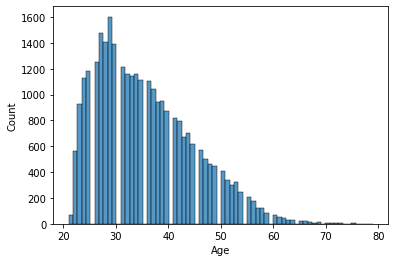

In [ ]:
# visualizing the Age column for better understanding with histplot
sns.histplot(df['Age'])

From this hist plot we can divide age into 9 bins

In [ ]:
# we are using Bining in Age column
df['Age_group'] = pd.cut(df.Age, bins=[20,25,30,35,40,45,50,55,60,80],labels=['21-25','26-30','31-35','36-40','41-45','46-50','51-55','56-60','61 and Above'])
cat_df['Age_group'] = pd.cut(df.Age, bins=[20,25,30,35,40,45,50,55,60,80],labels=['21-25','26-30','31-35','36-40','41-45','46-50','51-55','56-60','61 and Above'])

##<b> Repayments status columns

In [ ]:
#value counts of all Repayments status Columns 
for i in repayment_df.columns:
  print('column name = ', i)
  print(repayment_df[i].value_counts())

column name =  Repayment_September
 0    14737
-1     5682
 1     3667
-2     2750
 2     2666
 3      322
 4       76
 5       26
 8       19
 6       11
 7        9
Name: Repayment_September, dtype: int64
column name =  Repayment_August
 0    15730
-1     6046
 2     3926
-2     3752
 3      326
 4       99
 1       28
 5       25
 7       20
 6       12
 8        1
Name: Repayment_August, dtype: int64
column name =  Repayment_July
 0    15764
-1     5934
-2     4055
 2     3819
 3      240
 4       75
 7       27
 6       23
 5       21
 1        4
 8        3
Name: Repayment_July, dtype: int64
column name =  Repayment_June
 0    16455
-1     5683
-2     4318
 2     3159
 3      180
 4       68
 7       58
 5       35
 6        5
 1        2
 8        2
Name: Repayment_June, dtype: int64
column name =  Repayment_May
 0    16947
-1     5535
-2     4516
 2     2626
 3      178
 4       83
 7       58
 5       17
 6        4
 8        1
Name: Repayment_May, dtype: int64
column name =  

In data description we have not given information about 0 and -2 values 

In [ ]:
# Value count percentage of Repayments status columns with respect of Defaulter
for i in repayment_df.columns:
  print('column name = ',i)
  print(df[repayment_df[i]<=0].Defaulter.value_counts(normalize=True))

column name =  Repayment_September
0    0.861625
1    0.138375
Name: Defaulter, dtype: float64
column name =  Repayment_August
0    0.837238
1    0.162762
Name: Defaulter, dtype: float64
column name =  Repayment_July
0    0.82802
1    0.17198
Name: Defaulter, dtype: float64
column name =  Repayment_June
0    0.820381
1    0.179619
Name: Defaulter, dtype: float64
column name =  Repayment_May
0    0.815468
1    0.184532
Name: Defaulter, dtype: float64
column name =  Repayment_April
0    0.813293
1    0.186707
Name: Defaulter, dtype: float64


In [ ]:
# Defining function for all Repayments status value less than 0 consider as 0
def repaymentsstatus(delay):
    if delay <= 0:
      return 0
    else:
      return delay

In [ ]:
# Apply function on Repayments status columns
for i in repayment_df.columns:
  df[i]=df[i].apply(repaymentsstatus)

#<b> Outlier Treatment 

##<b> Limit Balance

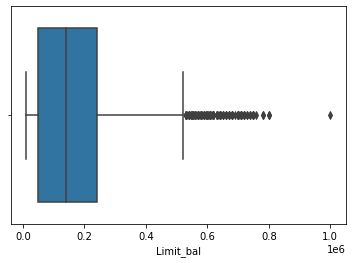

In [ ]:
# Box plot of Limit balance
sns.boxplot(df['Limit_bal'])

In [ ]:
# Binning the limit balance columns in 10 bins
limit_bal_group = pd.cut(df['Limit_bal'],bins=10)

In [ ]:
# Checking the outliers
limit_bal_group.value_counts()

(9010.0, 109000.0]       12490
(109000.0, 208000.0]      7867
(208000.0, 307000.0]      5053
(307000.0, 406000.0]      2752
(406000.0, 505000.0]      1597
(505000.0, 604000.0]       127
(604000.0, 703000.0]        56
(703000.0, 802000.0]        22
(901000.0, 1000000.0]        1
(802000.0, 901000.0]         0
Name: Limit_bal, dtype: int64

In [ ]:
# Checking the dependent variable values on the outlier points
df[df['Limit_bal']>=703000].Defaulter.value_counts()

0    20
1     3
Name: Defaulter, dtype: int64

In [ ]:
# Removing the outliers
df=df[df['Limit_bal']<=703000].reset_index(drop=True)

## All Bills Columns

In [ ]:
# creating Bills dataframe
bills_df = df[['Sep_Bill','Aug_Bill', 'July_Bill', 'June_Bill', 'May_Bill', 'Apr_Bill']]

In [ ]:
# Describe bills column
bills_df.describe()

,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill
count,29942.000000,29942.000000,2.994200e+04,29942.000000,29942.000000,29942.000000
mean,51187.253290,49155.328635,4.699245e+04,43239.816813,40269.001403,38821.955781
std,73281.858708,70892.416789,6.918713e+04,64074.736744,60438.750802,59165.380034
min,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000
25%,3588.750000,3008.000000,2.709500e+03,2355.000000,1782.250000,1261.000000
50%,22430.500000,21278.500000,2.011950e+04,19072.000000,18126.500000,17111.500000
75%,67134.250000,64027.750000,6.017450e+04,54551.250000,50208.500000,49205.750000
max,653062.000000,743970.000000,1.664089e+06,706864.000000,823540.000000,699944.000000


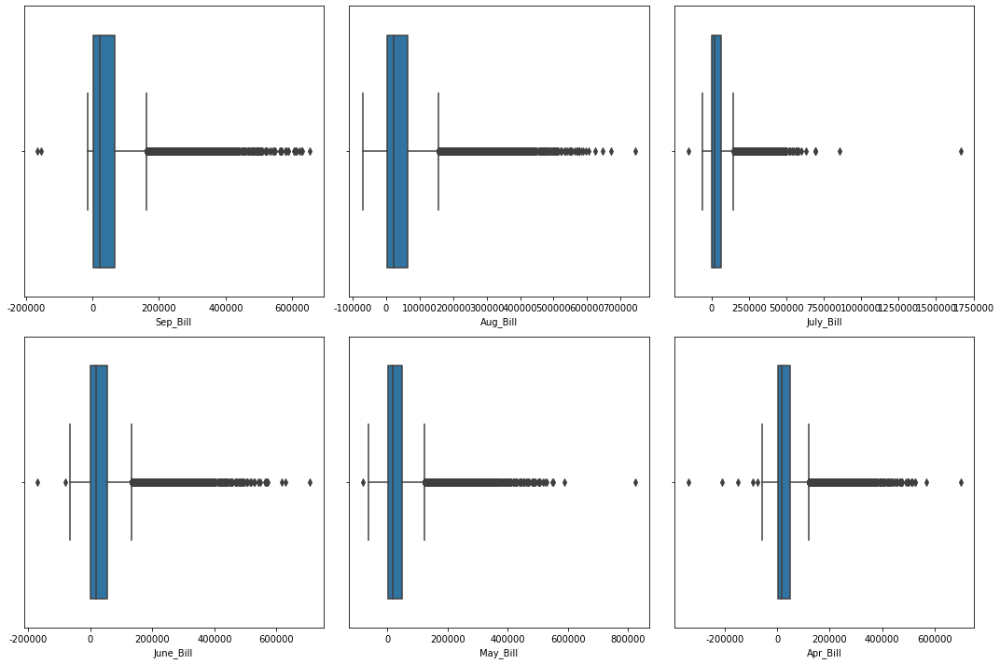

In [ ]:
# Visualizing the outlier pints for each month
plt.figure(figsize=(15,10))
n=1
for column in bills_df.columns:
  plt.subplot(2,3,n)
  n=n+1
  ax=sns.boxplot(df[column])
  ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
  plt.tight_layout()

In [ ]:
# Binning the bills coulmnns into 11bins each
bills_df['sep_group'] = pd.cut(bills_df['Sep_Bill'],bins=11)
bills_df['aug_group'] = pd.cut(bills_df['Aug_Bill'],bins=11)
bills_df['july_group'] = pd.cut(bills_df['July_Bill'],bins=11)
bills_df['june_group'] = pd.cut(bills_df['June_Bill'],bins=11)
bills_df['may_group'] = pd.cut(bills_df['May_Bill'],bins=11)
bills_df['apr_group'] = pd.cut(bills_df['Apr_Bill'],bins=11)

In [ ]:
# Checking the outlier values for month september
bills_df['sep_group'].value_counts()

(-16736.0, 57686.0]        21474
(57686.0, 132108.0]         5078
(132108.0, 206530.0]        2002
(206530.0, 280952.0]         781
(280952.0, 355374.0]         332
(355374.0, 429796.0]         155
(429796.0, 504218.0]          79
(504218.0, 578640.0]          26
(578640.0, 653062.0]          13
(-166398.642, -91158.0]        2
(-91158.0, -16736.0]           0
Name: sep_group, dtype: int64

In [ ]:
bills_df[bills_df['Sep_Bill']<=-5000].shape

(18, 12)

In [ ]:
# Checking the outlier values for month august
bills_df['aug_group'].value_counts()

(4200.0, 78177.0]       15477
(-70590.747, 4200.0]     8268
(78177.0, 152154.0]      3711
(152154.0, 226131.0]     1472
(226131.0, 300108.0]      573
(300108.0, 374085.0]      239
(374085.0, 448062.0]      123
(448062.0, 522039.0]       55
(522039.0, 596016.0]       18
(596016.0, 669993.0]        4
(669993.0, 743970.0]        2
Name: aug_group, dtype: int64

In [ ]:
bills_df[bills_df['Aug_Bill']<=-5000].shape

(33, 12)

In [ ]:
# Checking the outlier values for month July
bills_df['july_group'].value_counts()

(8313.545, 173891.091]        17773
(-159085.353, 8313.545]       10387
(173891.091, 339468.636]       1530
(339468.636, 505046.182]        230
(505046.182, 670623.727]         17
(670623.727, 836201.273]          3
(836201.273, 1001778.818]         1
(1498511.455, 1664089.0]          1
(1001778.818, 1167356.364]        0
(1167356.364, 1332933.909]        0
(1332933.909, 1498511.455]        0
Name: july_group, dtype: int64

In [ ]:
df[df['July_Bill']<=-5000].Defaulter.value_counts()

0    29
1     5
Name: Defaulter, dtype: int64

In [ ]:
# Checking the outlier values for month June
bills_df['june_group'].value_counts().sort_values(ascending=False)

(-10570.182, 69144.727]      23787
(69144.727, 148859.636]       4061
(148859.636, 228574.545]      1348
(228574.545, 308289.455]       446
(308289.455, 388004.364]       179
(388004.364, 467719.273]        68
(467719.273, 547434.182]        29
(-90285.091, -10570.182]        15
(547434.182, 627149.091]         6
(627149.091, 706864.0]           2
(-170876.864, -90285.091]        1
Name: june_group, dtype: int64

In [ ]:
df[df['June_Bill']<=-5000].Defaulter.value_counts()

0    24
1     9
Name: Defaulter, dtype: int64

In [ ]:
# Checking the outlier values for month May
bills_df['may_group'].value_counts().sort_values(ascending=False)

(927.273, 83188.545]        18992
(-82238.874, 927.273]        6338
(83188.545, 165449.818]      3109
(165449.818, 247711.091]     1022
(247711.091, 329972.364]      314
(329972.364, 412233.636]      109
(412233.636, 494494.909]       46
(494494.909, 576756.182]       10
(576756.182, 659017.455]        1
(741278.727, 823540.0]          1
(659017.455, 741278.727]        0
Name: may_group, dtype: int64

In [ ]:
df[df['May_Bill']<=-5000].Defaulter.value_counts()

0    36
1     6
Name: Defaulter, dtype: int64

In [ ]:
# Checking the outlier values for month April
bills_df['apr_group'].value_counts().sort_values(ascending=False)

(-56090.182, 38414.091]       20843
(38414.091, 132918.364]        6836
(132918.364, 227422.636]       1692
(227422.636, 321926.909]        401
(321926.909, 416431.182]        114
(416431.182, 510935.455]         43
(510935.455, 605439.727]          6
(-150594.455, -56090.182]         3
(-245098.727, -150594.455]        2
(-340642.547, -245098.727]        1
(605439.727, 699944.0]            1
Name: apr_group, dtype: int64

In [ ]:
df[df['Apr_Bill']<=-5000].Defaulter.value_counts()

0    46
1     7
Name: Defaulter, dtype: int64

In [ ]:
# Removing the outliers
df=df[(df['Sep_Bill']<=504218) & (df['Sep_Bill']>=-5000) & (df['Aug_Bill']<=522039) & (df['Aug_Bill']>=-5000) & (df['July_Bill']<=505046) & (df['July_Bill']>=-5000) & (df['June_Bill']<=467719) & (df['June_Bill']>=-5000) & (df['May_Bill']<=494494) & (df['May_Bill']>=-5000) & (df['Apr_Bill']<=510935) & (df['Apr_Bill']>=-5000)].reset_index(drop=True)

In [ ]:
df.head()

,Limit_bal,Gender,Education,Marital_status,Age,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April,Defaulter,Age_group
0,20000,Female,university,married,24,2,2,0,0,0,0,3913,3102,689,0,0,0,0,689,0,0,0,0,1,21-25
1,120000,Female,university,single,26,0,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,26-30
2,90000,Female,university,single,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,31-35
3,50000,Female,university,married,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,36-40
4,50000,Male,university,married,57,0,0,0,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,56-60


## All Payment columns

In [ ]:
pay_df = df[['Pay_Sep','Pay_Aug', 'Pay_July', 'Pay_June', 'Pay_May', 'Pay_April']]

In [ ]:
pay_df.describe()

,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April
count,29741.000000,2.974100e+04,29741.000000,29741.000000,29741.000000,29741.000000
mean,5562.056118,5.657096e+03,5052.685686,4680.546888,4662.487879,5049.766282
std,15874.953306,1.813438e+04,15940.027880,14461.231397,14420.564354,17050.374144
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,1000.000000,8.460000e+02,390.000000,300.000000,259.000000,118.000000
50%,2100.000000,2.007000e+03,1800.000000,1500.000000,1500.000000,1500.000000
75%,5001.000000,5.000000e+03,4500.000000,4000.000000,4000.000000,4000.000000
max,873552.000000,1.215471e+06,889043.000000,621000.000000,426529.000000,528666.000000


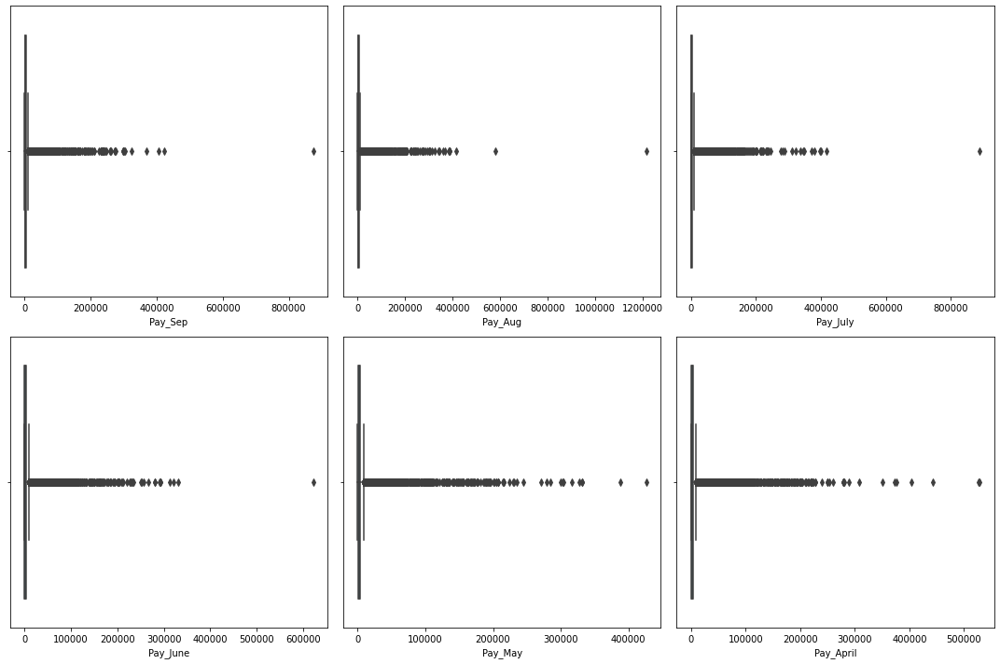

In [ ]:
# Visualzing the outliers
plt.figure(figsize=(15,10))
n=1
for column in pay_df.columns:
  plt.subplot(2,3,n)
  n=n+1
  ax=sns.boxplot(df[column])
  ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
  plt.tight_layout()

In [ ]:
# Binning the Payment columns into 11 bins each
pay_df['sep_pay_group'] = pd.cut(pay_df['Pay_Sep'],bins=11)
pay_df['aug_pay_group'] = pd.cut(pay_df['Pay_Aug'],bins=11)
pay_df['july_pay_group'] = pd.cut(pay_df['Pay_July'],bins=11)
pay_df['june_pay_group'] = pd.cut(pay_df['Pay_June'],bins=11)
pay_df['may_pay_group'] = pd.cut(pay_df['Pay_May'],bins=11)
pay_df['apr_pay_group'] = pd.cut(pay_df['Pay_April'],bins=11)

In [ ]:
# Checking the ouliers for month September
pay_df['sep_pay_group'].value_counts()

(-873.552, 79413.818]       29517
(79413.818, 158827.636]       161
(158827.636, 238241.455]       41
(238241.455, 317655.273]       17
(317655.273, 397069.091]        2
(397069.091, 476482.909]        2
(794138.182, 873552.0]          1
(476482.909, 555896.727]        0
(555896.727, 635310.545]        0
(635310.545, 714724.364]        0
(714724.364, 794138.182]        0
Name: sep_pay_group, dtype: int64

In [ ]:
# Checking the ouliers for month August
pay_df['aug_pay_group'].value_counts()

(-1215.471, 110497.364]      29589
(110497.364, 220994.727]       116
(220994.727, 331492.091]        26
(331492.091, 441989.455]         8
(552486.818, 662984.182]         1
(1104973.636, 1215471.0]         1
(441989.455, 552486.818]         0
(662984.182, 773481.545]         0
(773481.545, 883978.909]         0
(883978.909, 994476.273]         0
(994476.273, 1104973.636]        0
Name: aug_pay_group, dtype: int64

In [ ]:
# Checking the ouliers for month July
pay_df['july_pay_group'].value_counts()

(-889.043, 80822.091]       29507
(80822.091, 161644.182]       185
(161644.182, 242466.273]       34
(323288.364, 404110.455]        8
(242466.273, 323288.364]        5
(404110.455, 484932.545]        1
(808220.909, 889043.0]          1
(484932.545, 565754.636]        0
(565754.636, 646576.727]        0
(646576.727, 727398.818]        0
(727398.818, 808220.909]        0
Name: july_pay_group, dtype: int64

In [ ]:
# Checking the ouliers for month June
pay_df['june_pay_group'].value_counts()

(-621.0, 56454.545]         29397
(56454.545, 112909.091]       237
(112909.091, 169363.636]       66
(169363.636, 225818.182]       24
(225818.182, 282272.727]       10
(282272.727, 338727.273]        6
(564545.455, 621000.0]          1
(338727.273, 395181.818]        0
(395181.818, 451636.364]        0
(451636.364, 508090.909]        0
(508090.909, 564545.455]        0
Name: june_pay_group, dtype: int64

In [ ]:
# Checking the ouliers for month May
pay_df['may_pay_group'].value_counts()

(-426.529, 38775.364]       29190
(38775.364, 77550.727]        311
(77550.727, 116326.091]       142
(116326.091, 155101.455]       37
(155101.455, 193876.818]       31
(193876.818, 232652.182]       16
(271427.545, 310202.909]        5
(310202.909, 348978.273]        4
(232652.182, 271427.545]        3
(387753.636, 426529.0]          2
(348978.273, 387753.636]        0
Name: may_pay_group, dtype: int64

In [ ]:
# Checking the ouliers for month April
pay_df['apr_pay_group'].value_counts()

(-528.666, 48060.545]       29209
(48060.545, 96121.091]        303
(96121.091, 144181.636]       112
(144181.636, 192242.182]       66
(192242.182, 240302.727]       34
(240302.727, 288363.273]        8
(336423.818, 384484.364]        3
(288363.273, 336423.818]        2
(480605.455, 528666.0]          2
(384484.364, 432544.909]        1
(432544.909, 480605.455]        1
Name: apr_pay_group, dtype: int64

In [ ]:
# Removing the outliers
df=df[(df['Pay_Sep']<=238241) & (df['Pay_Aug']<=220994) & (df['Pay_July']<=161644) & (df['Pay_June']<=169363) & (df['Pay_May']<=155101) & (df['Pay_April']<=192242)].reset_index(drop=True)

In [ ]:
# Final data shape after removing outliers
df.shape

(29503, 25)

##<b> I have removed all the data of the people who had made their payment on time but still they were showing defaulter. 

In [ ]:
df=df[~((df['Repayment_April']==0) & (df['Repayment_May']==0) & (df['Repayment_June']==0) & (df['Repayment_July']==0) & (df['Repayment_August']==0) & (df['Repayment_September']==0) & (df['Defaulter']==1))]

#<b> Pandas profiling

In [ ]:
from pandas_profiling import ProfileReport
report = ProfileReport(df)
report.to_file(output_file='output.html')

Summarize dataset:   0%|          | 0/38 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#<b> EDA 

## <b> Prepare Data for EDA

In [ ]:
# Divide data from its basic feature 
cat_df = df[['Gender','Education','Marital_status','Age_group']]
repayment_df =df[['Repayment_September','Repayment_August','Repayment_July','Repayment_June','Repayment_May','Repayment_April']]
bills_df = df[['Sep_Bill','Aug_Bill', 'July_Bill', 'June_Bill', 'May_Bill', 'Apr_Bill']]
pay_df = df[['Pay_Sep','Pay_Aug', 'Pay_July', 'Pay_June', 'Pay_May', 'Pay_April']]

In [ ]:
# Binning the limit balance columns in 10 bins
limit_bal_group = pd.cut(df['Limit_bal'],bins=10)
# Binning the bills coulmnns into 11 bins each
bills_df['sep_group'] = pd.cut(bills_df['Sep_Bill'],bins=11)
bills_df['aug_group'] = pd.cut(bills_df['Aug_Bill'],bins=11)
bills_df['july_group'] = pd.cut(bills_df['July_Bill'],bins=11)
bills_df['june_group'] = pd.cut(bills_df['June_Bill'],bins=11)
bills_df['may_group'] = pd.cut(bills_df['May_Bill'],bins=11)
bills_df['apr_group'] = pd.cut(bills_df['Apr_Bill'],bins=11)
# Binning the Payment columns into 11 bins each
pay_df['sep_pay_group'] = pd.cut(pay_df['Pay_Sep'],bins=11)
pay_df['aug_pay_group'] = pd.cut(pay_df['Pay_Aug'],bins=11)
pay_df['july_pay_group'] = pd.cut(pay_df['Pay_July'],bins=11)
pay_df['june_pay_group'] = pd.cut(pay_df['Pay_June'],bins=11)
pay_df['may_pay_group'] = pd.cut(pay_df['Pay_May'],bins=11)
pay_df['apr_pay_group'] = pd.cut(pay_df['Pay_April'],bins=11)

##<b> Dependent Variable

In [ ]:
# value count 
df['Defaulter'].value_counts()

0    22950
1     4263
Name: Defaulter, dtype: int64

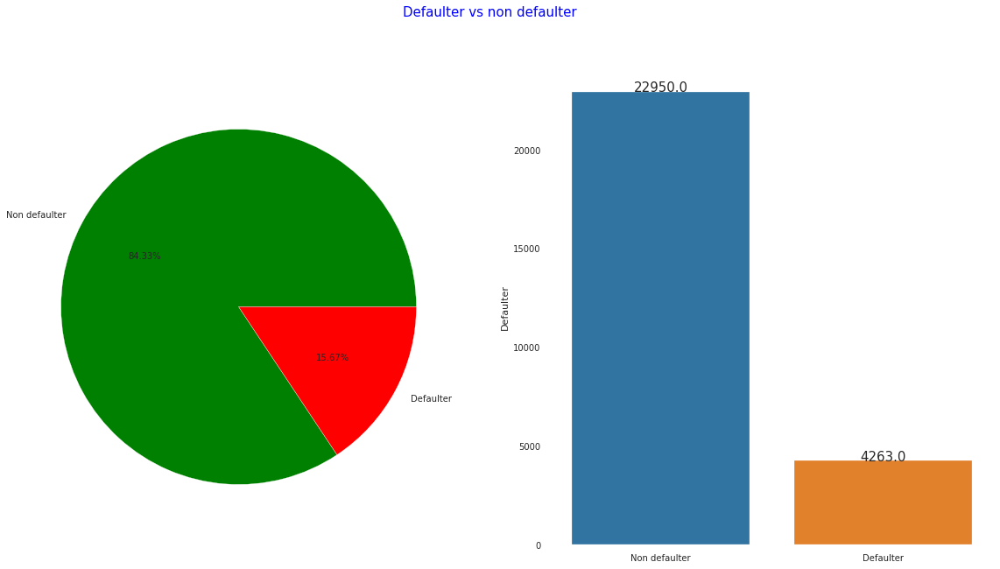

In [ ]:
# Pie plot
plt.figure(figsize=(20,10))
plt.suptitle("Defaulter vs non defaulter",fontsize=15,color='blue')
plt.subplot(1,2,1)
plt.pie(df['Defaulter'].value_counts(),labels=['Non defaulter','Defaulter'],autopct='%0.2f%%',colors=['green','red'])
plt.subplot(1,2,2)
ax=sns.barplot(['Non defaulter','Defaulter'],df['Defaulter'].value_counts())
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.25,rect.get_height(),horizontalalignment='center', fontsize = 15)

plt.show()

<b>15.67 % of the customers are Defaulters and rest are non defaulters, we observed data is imbalanced 

##<b> Categorical DataFrame

In [ ]:
# viewing first 5 rows of Catogerical data frame
cat_df.head()

,Gender,Education,Marital_status,Age_group
0,Female,university,married,21-25
1,Female,university,single,26-30
2,Female,university,single,31-35
3,Female,university,married,36-40
4,Male,university,married,56-60


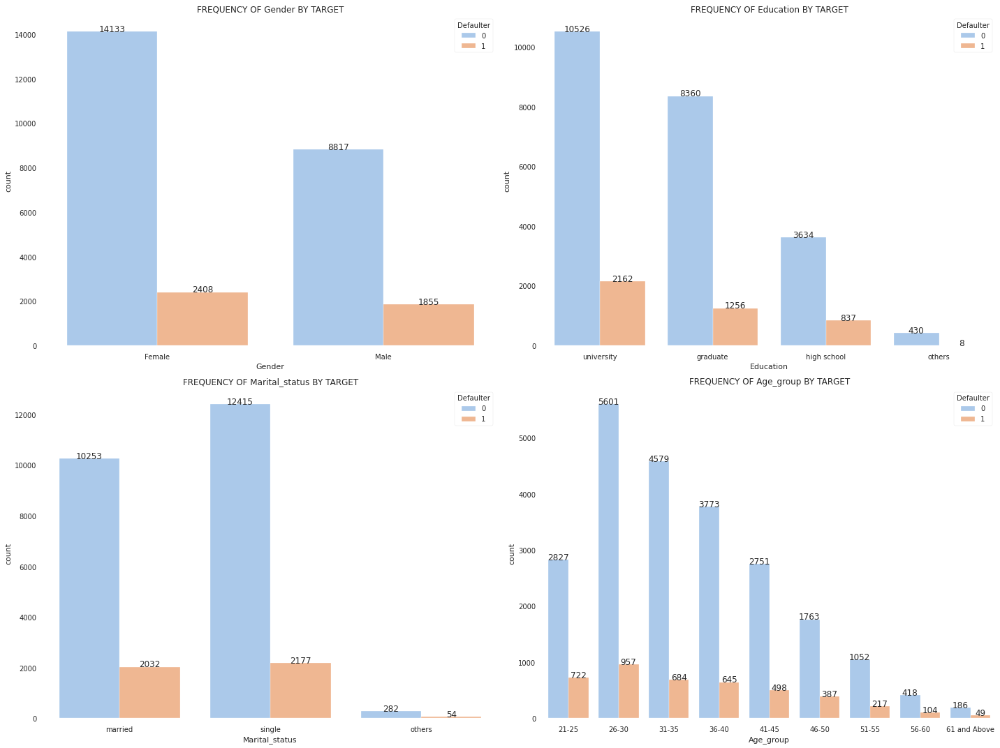

In [ ]:
# FREQUENCY OF categorical feature by TARGET
n = 1
plt.figure(figsize=(20,15))
for i in cat_df.columns:
  plt.subplot(2,2,n)
  n=n+1
  ax = sns.countplot(cat_df[i], hue=df["Defaulter"],palette='pastel')
  
  plt.title(f'FREQUENCY OF {i} BY TARGET')
  plt.tight_layout()
  for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.25,rect.get_height(),horizontalalignment='center', fontsize = 12)

<b> This is the visualized comparision of Defaulters and non defaulters with respect to catogerical features.
and we observe that the ratio of defaulters and non defaulters are following same trend on all the categorical features

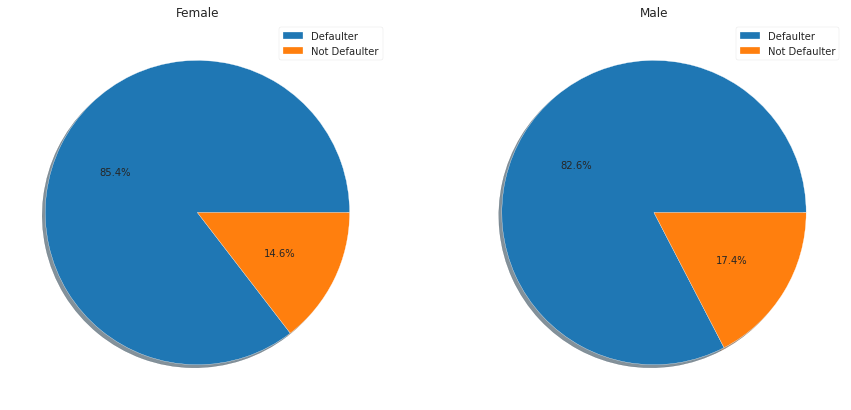

In [ ]:
# Percentage of Defaulters with respect to Gender
plt.figure(figsize=(15,10))
j=1
for i in list(np.unique(df['Gender'])):
  plt.subplot(1, 2, j)
  j+=1
  df[df['Gender']==i].Defaulter.value_counts().plot.pie(autopct='%1.1f%%', shadow=True,labeldistance=None)
  plt.legend(['Defaulter','Not Defaulter'], fontsize=10)
  plt.ylabel('')
  plt.title(i)

<b> Men have slightly higher chance of being a defaulter than women 

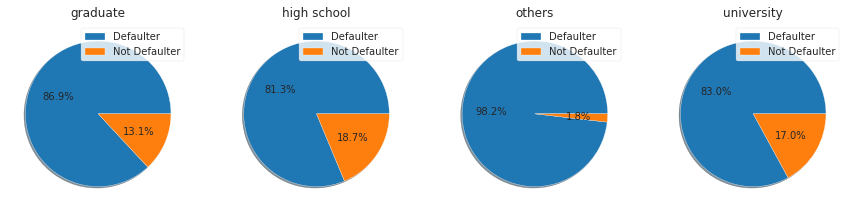

In [ ]:
# Percentage of Defaulter column with respect to Education
plt.figure(figsize=(15,10))
j=1
for i in list(np.unique(df['Education'])):
  plt.subplot(1,4, j)
  j+=1
  df[df['Education']==i].Defaulter.value_counts().plot.pie(autopct='%1.1f%%', shadow=True,labeldistance=None)
  plt.legend(['Defaulter','Not Defaulter'], fontsize=10)
  plt.ylabel('')
  plt.title(i)
plt.show()

<b> University have slightly higher chance of being a defaulter han others

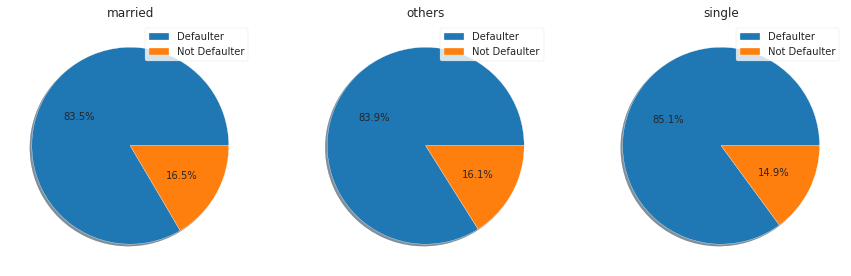

In [ ]:
# Percentage of Defaulter column with respect to Marital status
plt.figure(figsize=(15,10))
j=1
for i in list(np.unique(df['Marital_status'])):
  plt.subplot(1,3, j)
  j+=1
  df[df['Marital_status']==i].Defaulter.value_counts().plot.pie(autopct='%1.1f%%', shadow=True,labeldistance=None)
  plt.legend(['Defaulter','Not Defaulter'], fontsize=10)
  plt.ylabel('')
  plt.title(i)
plt.show()

<b> We cannot say whether someone will be a defaulter or not from his marital status

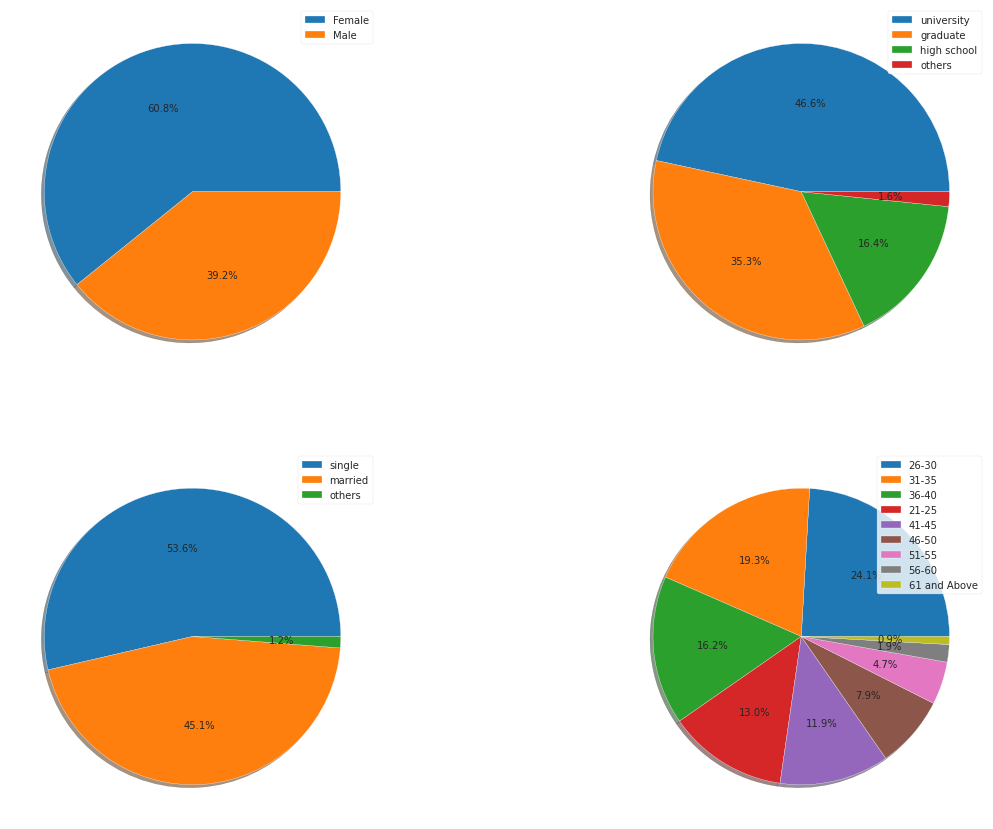

In [ ]:
# percentage of value count in each column
n = 1
plt.figure(figsize=(20,15))
for i in cat_df.columns:
  plt.subplot(2,2,n)
  n=n+1
  cat_df[i].value_counts().plot.pie(autopct='%1.1f%%', shadow=True,labeldistance=None)
  plt.legend(fontsize=10)
  plt.ylabel('')
  

<b> The complete catogerical data set has been analysed individually with repsect to their sub categories .

##<b> Repayment Dataframe

In [ ]:
repayment_df.head()

,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April
0,2,2,0,0,0,0
1,0,2,0,0,0,2
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0


In [ ]:
# Describe repayment df
repayment_df.describe()

,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April
count,27213.000000,27213.000000,27213.000000,27213.000000,27213.000000,27213.000000
mean,0.388528,0.350604,0.333076,0.283982,0.243119,0.248815
std,0.786599,0.832907,0.821649,0.792934,0.748351,0.745565
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000


In [ ]:
# Considering repayment more 3 months delay as one subcategory. only for the better visualization
for i in repayment_df.columns:
  repayment_df[i] = repayment_df[i].apply(lambda x:3 if x>=3 else x)

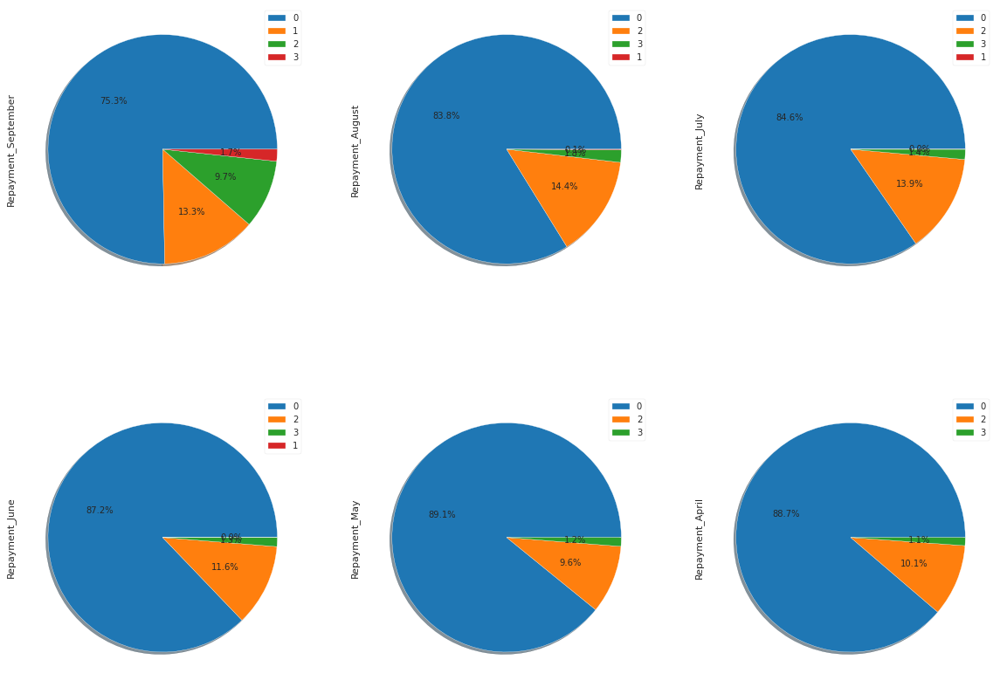

In [ ]:
# percentage of value count in each column
n = 1
plt.figure(figsize=(20,15))
for i in repayment_df.columns:
  plt.subplot(2,3,n)
  n=n+1
  ax = repayment_df[i].value_counts().plot.pie(autopct='%1.1f%%', shadow=True,labeldistance=None)
  plt.legend()

<b> Most of the customers pay duly in each months 

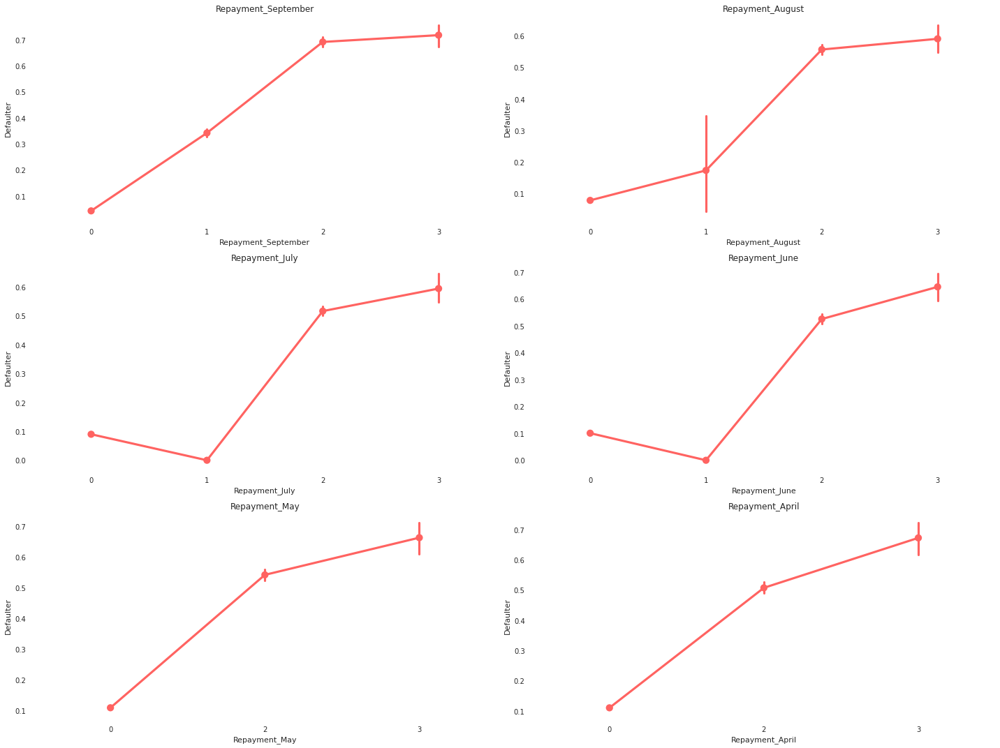

In [ ]:
# plt pointplot
n = 1
plt.figure(figsize=(20,15))
for i in repayment_df.columns:
  plt.subplot(3,2,n)
  n=n+1
  sns.pointplot(repayment_df[i],df['Defaulter'],color='#ff6361')
  plt.title(i)
  plt.tight_layout()

<b> The probabilty of customer being Defaulter is directly proportional to delay in repayment

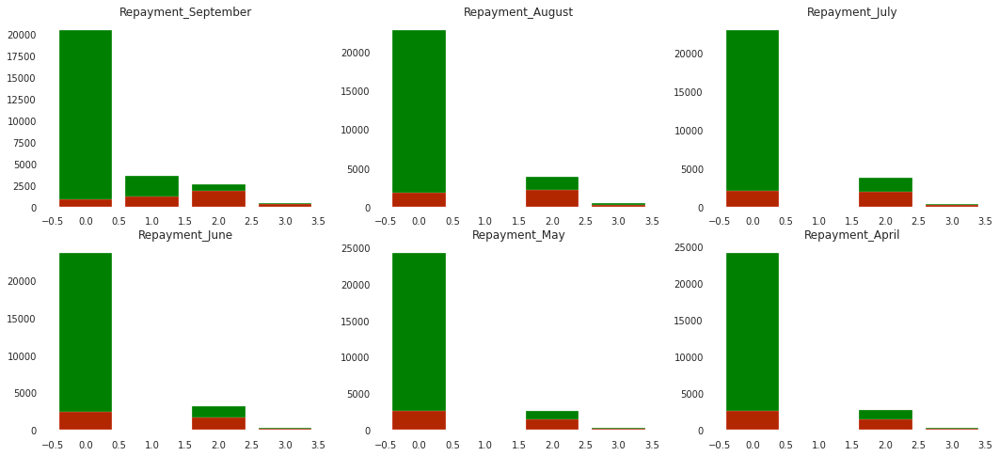

In [ ]:

pay_status_columns = repayment_df.columns
figure, ax = plt.subplots(2,3)
figure.set_size_inches(18,8)
for i in range(len(pay_status_columns)):
    row,col = int(i/3), i%3
    d  = repayment_df[pay_status_columns[i]].value_counts()
    x = repayment_df[pay_status_columns[i]][(df['Defaulter']==1)].value_counts()
    ax[row,col].bar(d.index, d, align='center', color='green')
    ax[row,col].bar(x.index, x, align='center', color='red', alpha=0.7)
    ax[row,col].set_title(pay_status_columns[i])    
plt.show()

<b> When Customers are pay duly then the count of defaulter is low.
<b> Defaulters are high when they are 3 months late

##<b> Limit Balance

In [ ]:
# Describe Limit balance column
df['Limit_bal'].describe()

count     27213.000000
mean     164993.642744
std      126930.379835
min       10000.000000
25%       50000.000000
50%      140000.000000
75%      230000.000000
max      700000.000000
Name: Limit_bal, dtype: float64

75% of the customers have a limit balance of less than 230,000

posx and posy should be finite values
posx and posy should be finite values


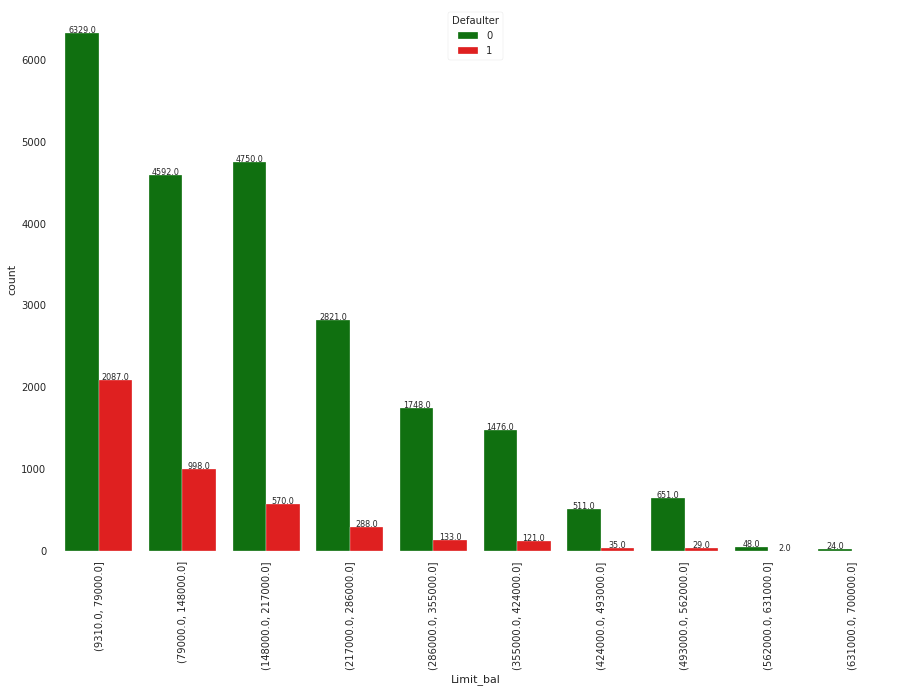

In [ ]:
#countplot for visualizing the limit bal group with Defaulters 
plt.figure(figsize=(15,10))
ax=sns.countplot(limit_bal_group,hue=df['Defaulter'],palette=["green", "red"])
plt.xticks(rotation=90)

for rect in ax.patches:
  ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.25,rect.get_height(),horizontalalignment='center', fontsize = 8)
plt.show()

We observed that the limit balance does not have a high impact on the customer being a defaulter. 

##<b> Bills Dataframe 

In [ ]:
bills_df.head()

,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill,sep_group,aug_group,july_group,june_group,may_group,apr_group
0,3913,3102,689,0,0,0,"(-5401.798, 41269.455]","(-5436.987, 41619.273]","(-5503.839, 40803.545]","(-5471.73, 37884.545]","(-5474.49, 38135.455]","(-5473.305, 38027.727]"
1,2682,1725,2682,3272,3455,3261,"(-5401.798, 41269.455]","(-5436.987, 41619.273]","(-5503.839, 40803.545]","(-5471.73, 37884.545]","(-5474.49, 38135.455]","(-5473.305, 38027.727]"
2,29239,14027,13559,14331,14948,15549,"(-5401.798, 41269.455]","(-5436.987, 41619.273]","(-5503.839, 40803.545]","(-5471.73, 37884.545]","(-5474.49, 38135.455]","(-5473.305, 38027.727]"
3,46990,48233,49291,28314,28959,29547,"(41269.455, 87432.909]","(41619.273, 88163.545]","(40803.545, 86607.091]","(-5471.73, 37884.545]","(-5474.49, 38135.455]","(-5473.305, 38027.727]"
4,8617,5670,35835,20940,19146,19131,"(-5401.798, 41269.455]","(-5436.987, 41619.273]","(-5503.839, 40803.545]","(-5471.73, 37884.545]","(-5474.49, 38135.455]","(-5473.305, 38027.727]"


In [ ]:
#Describe bill data frame
bills_df.describe()

,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill
count,27213.000000,27213.000000,27213.000000,27213.000000,27213.000000,27213.000000
mean,49881.945026,47987.635321,45666.118951,42031.041451,39231.233197,37774.178738
std,68583.798541,66213.048461,63509.086730,59138.677637,56017.157830,54919.953920
min,-4894.000000,-4925.000000,-5000.000000,-5000.000000,-5000.000000,-5000.000000
25%,3863.000000,3354.000000,3040.000000,2578.000000,2052.000000,1442.000000
50%,22895.000000,21930.000000,20487.000000,19359.000000,18466.000000,17521.000000
75%,66935.000000,63948.000000,59968.000000,54484.000000,50311.000000,49171.000000
max,502904.000000,507062.000000,498839.000000,466730.000000,469490.000000,468305.000000


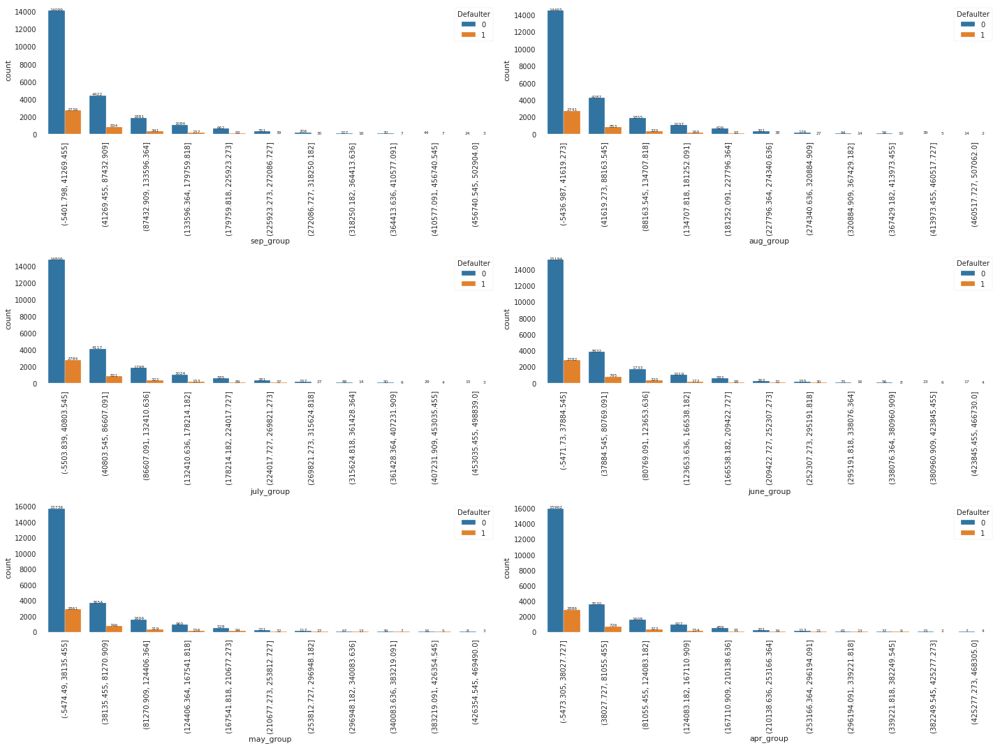

In [ ]:
# For Visualizing we are grouping the columns
columns = ['sep_group', 'aug_group', 'july_group', 'june_group','may_group', 'apr_group']
n = 1
plt.figure(figsize=(20,15))
for column in columns:
  plt.subplot(3,2,n)
  n = n+1
  ax=sns.countplot(bills_df[column],hue=df['Defaulter'])
  plt.xticks(rotation=90)
  plt.tight_layout()
  for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.25,rect.get_height(),horizontalalignment='center', fontsize = 6)

In [ ]:
# maximum billing in each month
total_bill = []
for i in bills_df.describe().columns:
  max = bills_df[i].sum()
  total_bill.append(max)

print('Maximum Bills', total_bill)
# Average bill in each Month
avg_bill = []
for i in bills_df.describe().columns:
  avg = bills_df[i].mean()
  avg_bill.append(avg)

print('Average Bills',avg_bill)

Maximum Bills [1357437370, 1305887520, 1242712095, 1143790731, 1067599549, 1027948726]
Average Bills [49881.94502627421, 47987.635321353766, 45666.1189505016, 42031.0414507772, 39231.23319736891, 37774.17873810311]


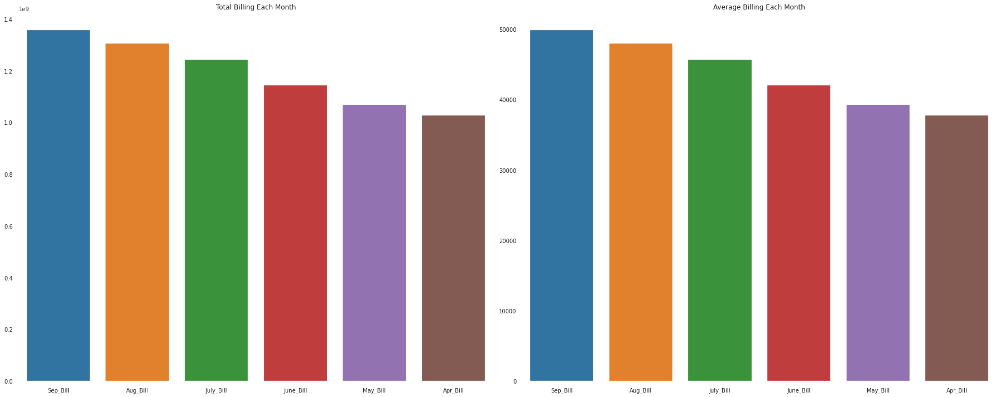

In [ ]:
# visualization of maximum & Average billing each month
fig,axes = plt.subplots(1,2,figsize=(25,10))
sns.barplot(bills_df.describe().columns, list(df[i].sum() for i in bills_df.describe().columns),ax=axes[0]).set_title("Total Billing Each Month")
sns.barplot(bills_df.describe().columns,list(df[i].mean() for i in bills_df.describe().columns),ax=axes[1]).set_title("Average Billing Each Month")
plt.tight_layout()

It is observed that the both total biling of the month and the average billing has an increasing trend over each month. 

##<b> Payment Dataframe

In [ ]:
pay_df.head()

,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April,sep_pay_group,aug_pay_group,july_pay_group,june_pay_group,may_pay_group,apr_pay_group
0,0,689,0,0,0,0,"(-237.0, 21545.455]","(-220.23, 20020.909]","(-160.944, 14631.273]","(-168.459, 15314.455]","(-155.067, 14097.0]","(-189.853, 17259.364]"
1,0,1000,1000,1000,0,2000,"(-237.0, 21545.455]","(-220.23, 20020.909]","(-160.944, 14631.273]","(-168.459, 15314.455]","(-155.067, 14097.0]","(-189.853, 17259.364]"
2,1518,1500,1000,1000,1000,5000,"(-237.0, 21545.455]","(-220.23, 20020.909]","(-160.944, 14631.273]","(-168.459, 15314.455]","(-155.067, 14097.0]","(-189.853, 17259.364]"
3,2000,2019,1200,1100,1069,1000,"(-237.0, 21545.455]","(-220.23, 20020.909]","(-160.944, 14631.273]","(-168.459, 15314.455]","(-155.067, 14097.0]","(-189.853, 17259.364]"
4,2000,36681,10000,9000,689,679,"(-237.0, 21545.455]","(20020.909, 40041.818]","(-160.944, 14631.273]","(-168.459, 15314.455]","(-155.067, 14097.0]","(-189.853, 17259.364]"


In [ ]:
#Describe pay_df
pay_df.describe()

,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April
count,27213.000000,27213.000000,27213.000000,27213.000000,27213.000000,27213.000000
mean,5339.348767,5291.258479,4651.054716,4357.285599,4235.453313,4582.049351
std,12946.834417,13125.518900,11378.821678,11232.291380,10485.500359,13024.255688
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1000.000000,836.000000,398.000000,300.000000,258.000000,130.000000
50%,2120.000000,2016.000000,1829.000000,1500.000000,1503.000000,1500.000000
75%,5003.000000,5000.000000,4500.000000,4000.000000,4000.000000,4000.000000
max,237000.000000,220230.000000,160944.000000,168459.000000,155067.000000,189853.000000


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

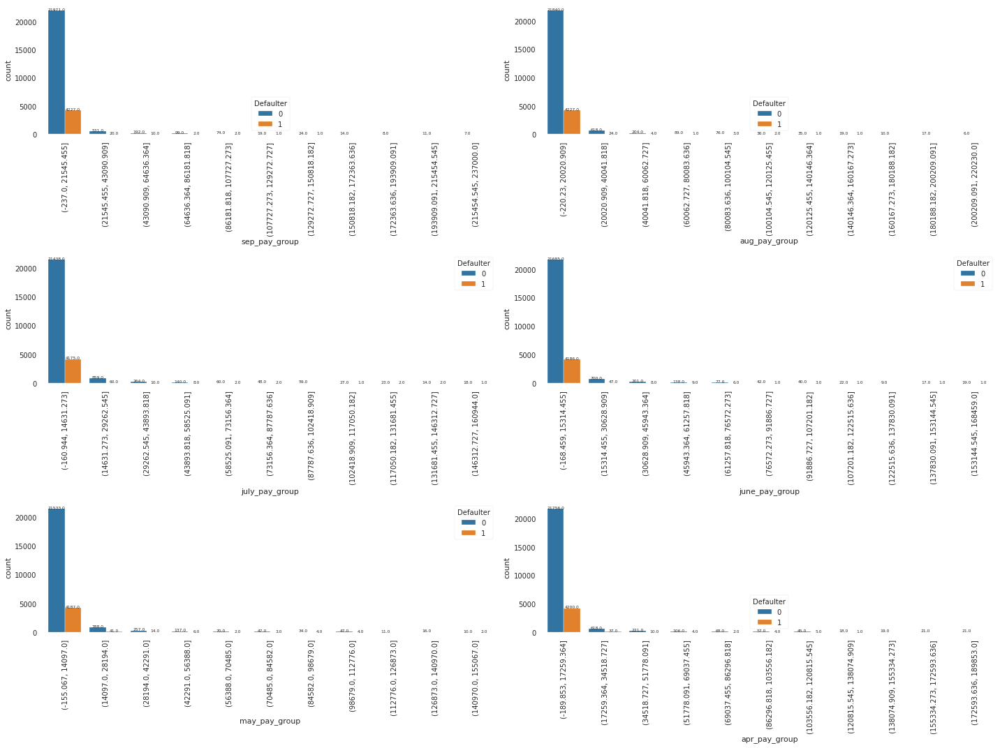

In [ ]:

columns = ['sep_pay_group', 'aug_pay_group', 'july_pay_group', 'june_pay_group',
       'may_pay_group', 'apr_pay_group']
n = 1
plt.figure(figsize=(20,15))
for column in columns:
  plt.subplot(3,2,n)
  n = n+1
  ax=sns.countplot(pay_df[column],hue=df['Defaulter'])
  plt.xticks(rotation=90)
  plt.tight_layout()
  for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.25,rect.get_height(),horizontalalignment='center', fontsize = 6)

In [ ]:
# maximum Payment in each month
max_pay = []
for i in pay_df.describe().columns:
  max = pay_df[i].max()
  max_pay.append(max)

print('Maximum Payment', max_pay)
# Average Payment in each Month
avg_pay = []
for i in pay_df.describe().columns:
  avg = pay_df[i].mean()
  avg_pay.append(avg)

print('Average Payment',avg_pay)

Maximum Payment [237000, 220230, 160944, 168459, 155067, 189853]
Average Payment [5339.348767133355, 5291.258479403226, 4651.0547164957925, 4357.285598794694, 4235.453312754933, 4582.0493514129275]


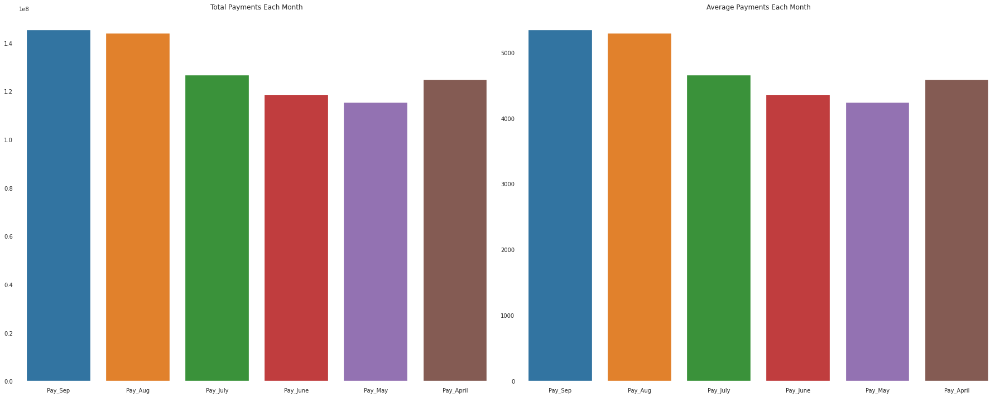

In [ ]:
# visualization of maximum, minimum & Average billing each month
fig,axes = plt.subplots(1,2,figsize=(25,10))
sns.barplot(pay_df.describe().columns,list(df[i].sum() for i in pay_df.describe().columns),ax=axes[0]).set_title("Total Payments Each Month")
sns.barplot(pay_df.describe().columns,list(df[i].mean() for i in pay_df.describe().columns),ax=axes[1]).set_title("Average Payments Each Month")
plt.tight_layout()

#<b> Correlation 

In [ ]:
#Correlation With dependent Variable 
abs(df.corr()['Defaulter']).sort_values(ascending=False)

Defaulter              1.000000
Repayment_September    0.565239
Repayment_August       0.468831
Repayment_July         0.417881
Repayment_June         0.388425
Repayment_May          0.371872
Repayment_April        0.353968
Limit_bal              0.183587
Pay_Aug                0.090341
Pay_Sep                0.089787
Pay_July               0.081655
Pay_April              0.072915
Pay_May                0.072842
Pay_June               0.072506
Sep_Bill               0.025963
Apr_Bill               0.017643
Aug_Bill               0.015021
May_Bill               0.012531
July_Bill              0.007699
Age                    0.004381
June_Bill              0.003943
Name: Defaulter, dtype: float64

It is observed that repayment columns and limit balance have higher correlation with the dependant variable. 


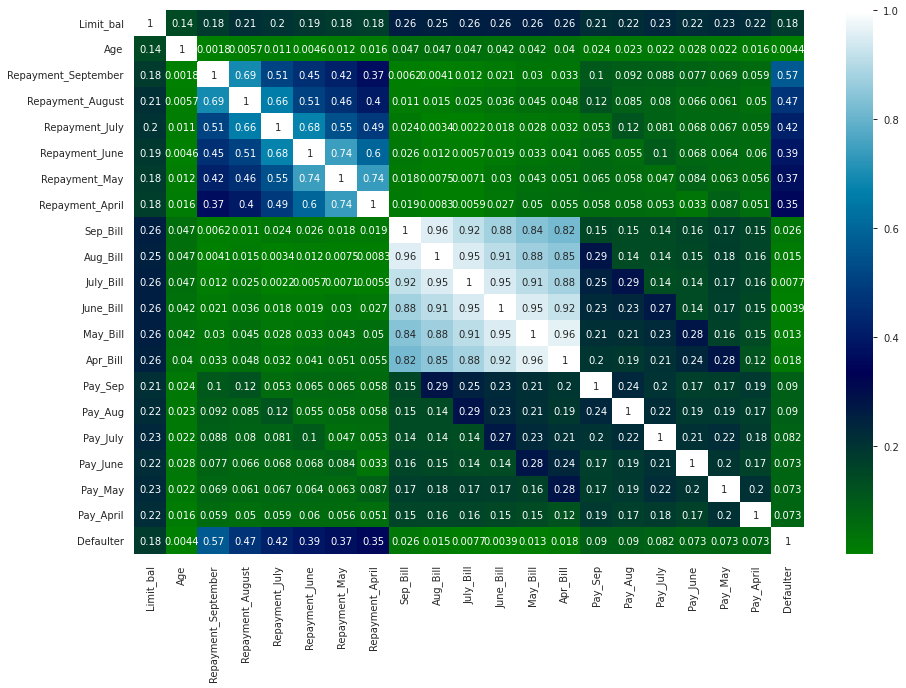

In [ ]:
# Heatmap of correlation
plt.figure(figsize=(15,10))
sns.heatmap(abs(df.corr()),cmap='ocean',annot=True)

#<b> Optimization
##Before moving onto performance metrics, let’s discuss optimization. What metric exactly are we optimizing? In this case, we are optimizing recall.

##Ideally, we do not want to allow any defaults to fall through the cracks, so our optimal model will minimize False Negatives (So RecallScore is as high as possible).

#<b> Prepare Data for algoritmes

In [ ]:
# Using One hot encoding on categorical features and storing in new data frame
new_df = pd.get_dummies(df,drop_first=True)

In [ ]:
new_df.head()

,Limit_bal,Age,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April,Defaulter,Gender_Male,Education_high school,Education_others,Education_university,Marital_status_others,Marital_status_single,Age_group_26-30,Age_group_31-35,Age_group_36-40,Age_group_41-45,Age_group_46-50,Age_group_51-55,Age_group_56-60,Age_group_61 and Above
0,20000,24,2,2,0,0,0,0,3913,3102,689,0,0,0,0,689,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,120000,26,0,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0
2,90000,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0
3,50000,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
4,50000,57,0,0,0,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0


In [ ]:
# split our data frame to dependent and independent features & droping age column because we bining the age column
X =new_df.drop(columns=['Defaulter','Age'])
y =new_df['Defaulter']

##<b> using smote for over sampling

In [ ]:
#importing SMote to make our dataset balanced
from imblearn.over_sampling import SMOTE

smote = SMOTE()

# fit predictor and target variable
X_smote, y_smote = smote.fit_resample(X,y)

print('Original dataset shape', len(new_df))
print('Resampled dataset shape', len(y_smote))

Original dataset shape 27213
Resampled dataset shape 45900


In [ ]:
# train test spilt data
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_smote,y_smote,test_size=0.2,random_state=0)

In [ ]:
#Scaling
from sklearn.preprocessing import StandardScaler,MinMaxScaler,PowerTransformer
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#<b> Defining Function

##<b> Defining the function (without Cv and Hyperparameter tuning) 

In [ ]:
#Creating empty list for storing metrices scores
train_accuracy_sco = []
test_accuracy_sco  = [] 
train_precision_sco = []
test_precision_sco =[]
train_recall_sco  = []
test_recall_sco  = []
train_f1_sco = []
test_f1_sco = []
train_roc_sco =[]
test_roc_sco =[]

In [ ]:
# Defining the function (without Cv and Hyperparameter tuning)
def matrix_without_hp(x_train,x_test,y_train,y_true):
  Log = LogisticRegression()
  SGD = SGDClassifier()
  svc = SVC()
  KNN = KNeighborsClassifier()
  DSTree = DecisionTreeClassifier()
  RFC = RandomForestClassifier()
  GBC = GradientBoostingClassifier()
  XGBC = XGBClassifier(silent=True)

  models = [Log, SGD, svc, KNN, DSTree, RFC, GBC, XGBC]

  for i in models:
    i.fit(x_train,y_train)
    train_pred = i.predict(x_train)
    test_pred = i.predict(x_test)

    # accuracy score
    train_accuracy = accuracy_score(y_train,train_pred)
    test_accuracy = accuracy_score(y_true,test_pred)
    
    # Precision score
    train_precision = precision_score(y_train,train_pred)
    test_precision = precision_score(y_true,test_pred)
    
    #recall Score
    train_recall = recall_score(y_train,train_pred)
    test_recall = recall_score(y_true,test_pred)
    
    # F1 score
    train_f1 = f1_score(y_train,train_pred)
    test_f1 = f1_score(y_true,test_pred)
    
    # ROC_AUC Score
    train_roc = roc_auc_score(y_train,train_pred)
    test_roc = roc_auc_score(y_true,test_pred)
    

    train_accuracy_sco.append(train_accuracy)
    test_accuracy_sco.append(test_accuracy)
    train_precision_sco.append(train_precision)
    test_precision_sco.append(test_precision)
    train_recall_sco.append(train_recall)
    test_recall_sco.append(test_recall)
    train_f1_sco.append(train_f1)
    test_f1_sco.append(test_f1)
    train_roc_sco.append(train_roc)
    test_roc_sco.append(test_roc)
  

  
  scores = pd.DataFrame(list(zip(train_accuracy_sco,test_accuracy_sco,train_precision_sco,test_precision_sco,
                                 train_recall_sco,test_recall_sco,train_f1_sco,test_f1_sco,train_roc_sco,test_roc_sco )),
                        index=['Logistic Regression', 'Stochastic Gradient Descent', 'Support Vector Classifier', 'K Nearest Neighbor', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'Extreme Gradient Boosting'],
                        columns=['Train accuracy score','Test accuracy score','Train precision score','Test precision score',
                                 'Train recall score','Test recall score','Train f1 score','Test f1 score','Train roc score','Test roc score'])
  return scores
  

## Defining fuction for all algorithem with hyperparameter tuning 

In [ ]:
#Creating empty list for storing metrices scores
train_accuracy_score = []
test_accuracy_score  = [] 
train_precision_score = []
test_precision_score =[]
train_recall_score  = []
test_recall_score  = []
train_f1_score = []
test_f1_score = []
train_roc_score =[]
test_roc_score =[]

In [ ]:
#
def matrix(model,x_train,x_test,y_train,y_true, logistic = False):
  # fitting model
  model.fit(x_train,y_train)
  print('\n')
  print('='*30, 'Training score','='*30)
  training = model.score(x_train,y_train)
  print('\n')
  print('Training score  = ', training)
 
  print('\n')

  # if we are using grid search sc or random search cv printing best parameters and best score
  print('='*20, 'Best Parameters and Best score','='*20)
  try:
    print('best parameters  =  ', model.best_params_)
    print('Best score  =  ', model.best_score_)
  except:
    pass

  # predicting x_train
  train_pred = model.predict(x_train) 
  # predicting x_test
  test_pred = model.predict(x_test)
  print('\n')

  # printing all metrices scores on training set and test set
  print('='*30, 'Metrices scores on Train and Test Set','='*30)
  train_accuracy = accuracy_score(y_train,train_pred)
  test_accuracy = accuracy_score(y_true,test_pred)
  print('Train Accuracy score = ',train_accuracy)
  print('Test Accuracy score = ',test_accuracy)
  train_precision = precision_score(y_train,train_pred)
  test_precision = precision_score(y_true,test_pred)
  print('Train Precision score = ', train_precision)
  print('Test Precision score = ', test_precision)
  train_recall = recall_score(y_train,train_pred)
  test_recall = recall_score(y_true,test_pred)
  print('Train Recall score = ',train_recall)
  print('Test Recall score = ',test_recall)
  train_f1 = f1_score(y_train,train_pred)
  test_f1 = f1_score(y_true,test_pred)
  print('Train F1 score = ',train_f1) 
  print('Test F1 score = ',test_f1) 
  train_roc = roc_auc_score(y_train,train_pred)
  test_roc = roc_auc_score(y_true,test_pred)
  print('Train ROC_AUC score = ',train_roc) 
  print('Test ROC_AUC score = ',test_roc) 
  print('\n')

  # Classification Report on test set
  print('='*30, 'Metrices scores on Train and Test Set','='*30)
  target_names = ['class 0', 'class 1']
  print(classification_report(y_true, test_pred, target_names=target_names))
  print('\n')
  # Classification Report on train set
  print('='*30, 'Classification Report on train set','='*30)
  target_names = ['class 0', 'class 1']
  print(classification_report(y_train, train_pred, target_names=target_names))
  print('\n')

  # Graph of cofusion matrix on test set
  print('='*30, 'Confusion Matrix on test set','='*30)
  cf_matrix = confusion_matrix(y_true,test_pred)
  plt.title('Heatmap of confusion matrix on test set')
  group_names = ['True Negative','False Positive','False Negative','True Positive']
  group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)
  sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')
  plt.show()
  print('\n')

  # Graph of cofusion matrix on train set
  print('='*30, 'Confusion Matrix on train set','='*30)
  cf_matrix = confusion_matrix(y_train,train_pred)
  plt.title('Heatmap of confusion matrix on train set')
  group_names = ['True Negative','False Positive','False Negative','True Positive']
  group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)
  sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')
  plt.show()
  print('\n')
  
  try:
  # logistc regression top 10 feature
    print('='*40, 'Top 10 Feature Importance','='*40)
    if logistic == True:
      top_10 = pd.DataFrame({'Features':X.columns, 'Importance':np.abs(model.best_estimator_.coef_).ravel() }).sort_values("Importance",ascending =False)[:10].reset_index(drop=True)
    # for other models top 10 features 
    else :
      top_10 = pd.DataFrame({'Features':X.columns, 'Importance':(model.best_estimator_.feature_importances_)}).sort_values("Importance",ascending =False)[:10].reset_index(drop=True)
    
    sns.set(rc={'figure.figsize':(15,10)})
    ax=sns.barplot(x=X.columns[:10],y=top_10['Importance'])
    plt.xticks(rotation=90)
    for index, row in top_10.iterrows():
      ax.text(row.name,row.Importance, round(row.Importance,4), color='red', ha="center")
    plt.show()
  except:
    pass

  #roc_auc Curve
  test_fpr, test_tpr, test_threshold = roc_curve(y_true, test_pred)
  train_fpr, train_tpr, train_threshold = roc_curve(y_train, train_pred)
  test_roc_auc = auc(test_fpr, test_tpr)
  train_roc_auc = auc(train_fpr, train_tpr)

  # method I: plt
  plt.title('Receiver Operating Characteristic curves')
  plt.plot(test_fpr, test_tpr, 'b', label = 'Test AUC = %0.2f' % test_roc_auc,color='red')
  plt.plot(train_fpr, train_tpr, 'b', label = 'Train AUC = %0.2f' % train_roc_auc,color='blue')
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()



  
  train_accuracy_score.append(train_accuracy)
  test_accuracy_score.append(test_accuracy)
  train_precision_score.append(train_precision)
  test_precision_score.append(test_precision)
  train_recall_score.append(train_recall)
  test_recall_score.append(test_recall)
  train_f1_score.append(train_f1)
  test_f1_score.append(test_f1)
  train_roc_score.append(train_roc)
  test_roc_score.append(test_roc)

  
  
  return train_pred,test_pred



##<b> Defining functions for model Explainability

### <b>*Lime*

In [ ]:
def lime_explainibilty(model, num_features, instance):
  feature_names =list(X.columns)

  explainer = lime.lime_tabular.LimeTabularExplainer(X.values,feature_names=feature_names,mode='classification')

  choosen_instance = X.reset_index(drop=True).loc[[instance]].values[0]
  exp = explainer.explain_instance(choosen_instance, model.predict_proba, num_features=num_features)

  exp.show_in_notebook(show_table=True)

### *ELI5*

In [ ]:
def eli5_explainability(model,row_number) :
  return eli.show_prediction(model, np.array(X_test.iloc[row_number]),
                    feature_names=X.columns.values,
                    show_feature_values=True)

#<b>Models without Hyperparameter tuning

<b>All the models are built and a dataframe evaluation metrics was obataned without hyperparameter tuning. 

 

In [ ]:
scores = matrix_without_hp(X_train_scaled,X_test_scaled,y_train,y_test)

In [ ]:
scores_without_hp=scores.sort_values("Test recall score",ascending=False).reset_index().rename(columns={'index':'model'})

In [ ]:
scores_without_hp

,model,Train accuracy score,Test accuracy score,Train precision score,Test precision score,Train recall score,Test recall score,Train f1 score,Test f1 score,Train roc score,Test roc score
0,Random Forest,0.998775,0.927560,0.998362,0.907790,0.999180,0.954018,0.998771,0.930330,0.998776,0.927186
1,Extreme Gradient Boosting,0.906454,0.906427,0.890442,0.891964,0.926213,0.927804,0.907975,0.909531,0.906523,0.906125
2,Gradient Boosting,0.906972,0.906209,0.891703,0.892244,0.925721,0.926945,0.908394,0.909263,0.907037,0.905916
3,Decision Tree,0.998775,0.898584,0.998961,0.897671,0.998579,0.902879,0.998770,0.900268,0.998774,0.898523
4,Support Vector Classifier,0.901634,0.894009,0.901949,0.898290,0.900470,0.891921,0.901209,0.895094,0.901630,0.894038
5,K Nearest Neighbor,0.926770,0.892375,0.924773,0.897786,0.928564,0.888913,0.926664,0.893328,0.926776,0.892424
6,Stochastic Gradient Descent,0.891231,0.889978,0.893561,0.893691,0.887407,0.888698,0.890473,0.891187,0.891218,0.889996
7,Logistic Regression,0.884205,0.883442,0.889246,0.890244,0.876804,0.878384,0.882981,0.884274,0.884179,0.883514


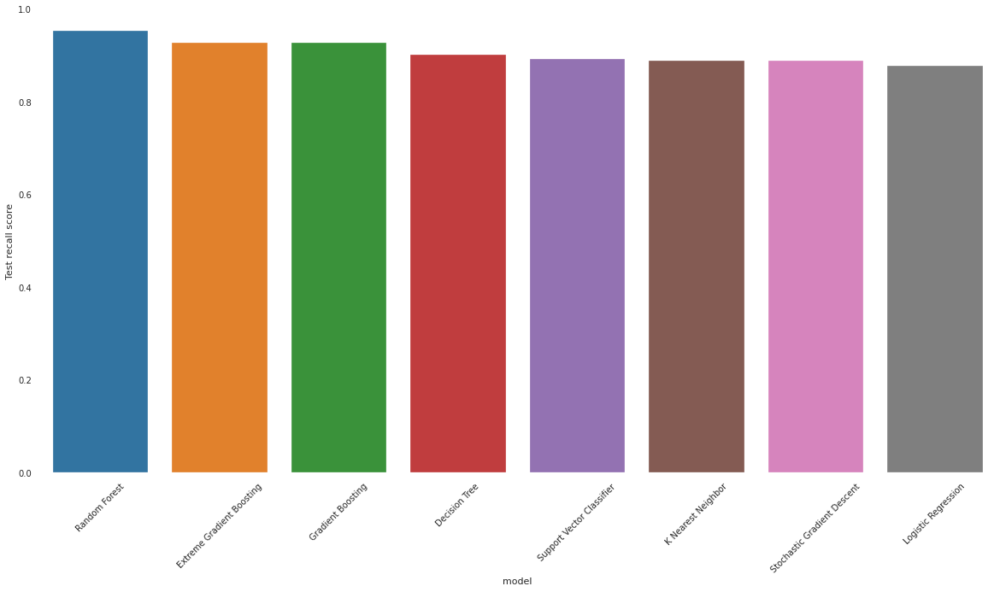

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(scores_without_hp['model'],scores_without_hp['Test recall score'])
plt.xticks(rotation=45)
plt.show()

#<B> Models with Hyperparameter tuning 

<b>Hyperparamter tuning was performed and the models were run again to optimise the results.

##<b> Logistic Regression

In [ ]:
# Parameters for logistic regression
logistic_parameters = {'C': [10],#0.001,0.01,0.1,1,10,100],
                       'penalty':['l2'],#l1, 'l2', 'elasticnet','None'],
                       'class_weight':['balanced'],#'dict',],
}
# After finding the best parameters, we commented on all the other parameters for faster execution

In [ ]:
# Using Grid Search for Hyperparameter Tuning
logistic_grid_search = GridSearchCV(LogisticRegression(),param_grid=logistic_parameters,cv=5,verbose=True,scoring='recall',n_jobs=-1)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


============================== Training score ==============================


Training score  =  0.8791539134236992


==================== Best Parameters and Best score ====================
best parameters  =   {'C': 10, 'class_weight': 'balanced', 'penalty': 'l2'}
Best score  =   0.8775687913775002


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.8848039215686274
Test Accuracy score =  0.8836601307189542
Train Precision score =  0.8884776844896155
Test Precision score =  0.8902916848062691
Train Recall score =  0.8791539134236992
Test Recall score =  0.878813923506661
Train F1 score =  0.8837912087912089
Test F1 score =  0.8845155709342561
Train ROC_AUC score =  0.8847842949663003
Test ROC_AUC score =  0.8837286586159023


============================== Metrices scores on Train and Test Set ==============================
              precision 

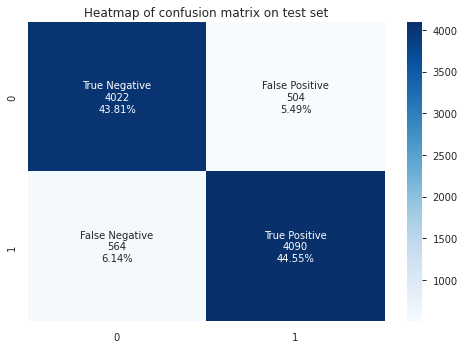



============================== Confusion Matrix on train set ==============================


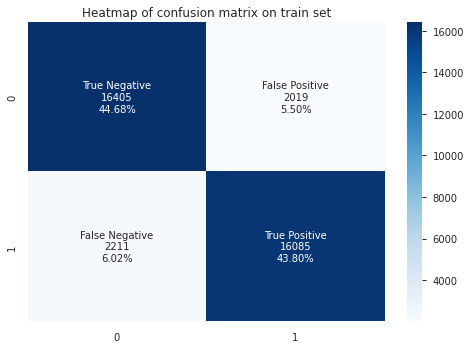



======================================== Top 10 Feature Importance ========================================


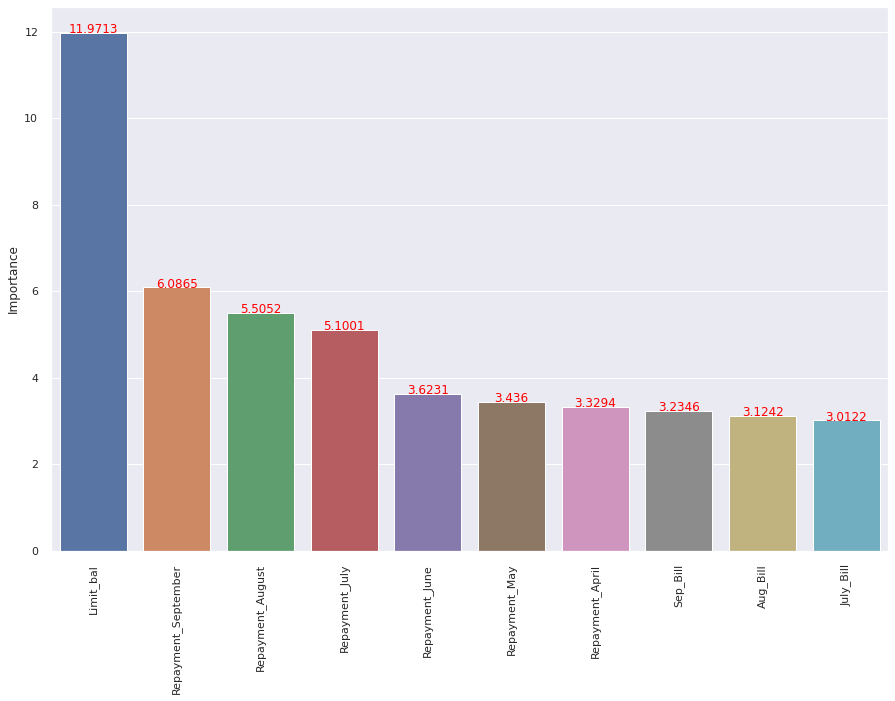

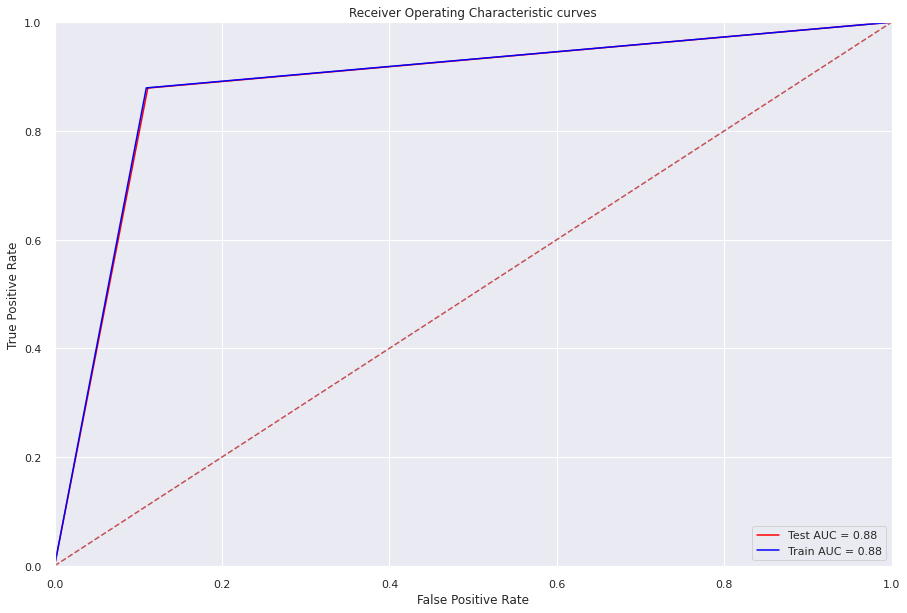

In [ ]:
# Fit and evalute model with the help of self define function
logistic_train_pred, logistic_test_pred = matrix(logistic_grid_search,X_train_scaled,X_test_scaled,y_train,y_test,logistic=True)

##<b> Stochastic Gradient Descent

In [ ]:
# parameter for Stochastic Gradient Descent
sgd_params  = {'penalty':['l1',],#'l2', 'elasticnet'],
               'alpha':[0.001],#0.01,0.0001],
               'max_iter':[1500],
               'class_weight':['dict','balanced']
    
}
# After finding the best parameters, we commented on all the other parameters for faster execution

In [ ]:
# using grid search cv for hyperparameter tuning
sgd_grid = GridSearchCV(SGDClassifier(),param_grid=sgd_params,cv=5,scoring='recall',n_jobs=-1)



============================== Training score ==============================


Training score  =  0.8819414079580236


==================== Best Parameters and Best score ====================
best parameters  =   {'alpha': 0.001, 'class_weight': 'balanced', 'max_iter': 1500, 'penalty': 'l1'}
Best score  =   0.8748354906010631


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.8896241830065359
Test Accuracy score =  0.8877995642701525
Train Precision score =  0.895002495978701
Test Precision score =  0.8954604975993016
Train Recall score =  0.8819414079580236
Test Recall score =  0.8816072195960464
Train F1 score =  0.8884239504473503
Test F1 score =  0.8884798614118666
Train ROC_AUC score =  0.8895974951210006
Test ROC_AUC score =  0.8878871272527293


============================== Metrices scores on Train and Test Set ==============================
              precision    recall  f1-score   support

   

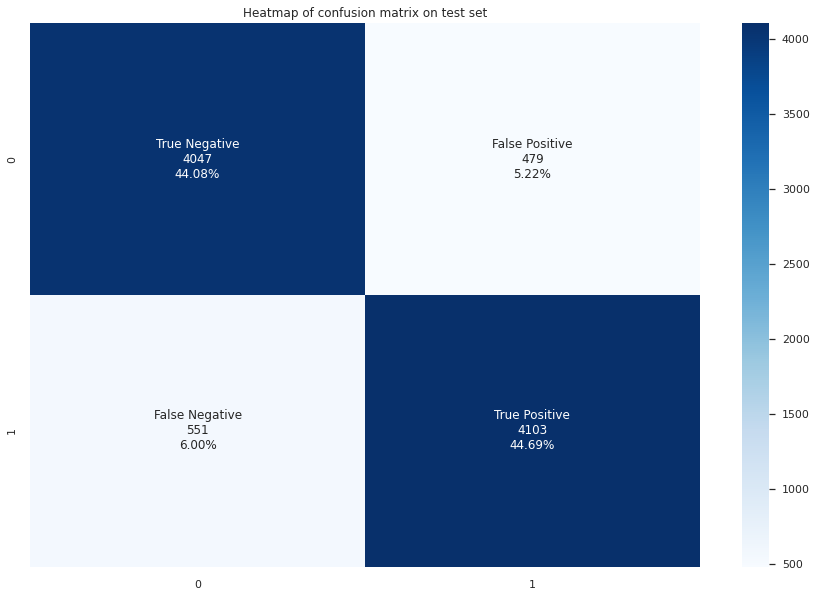



============================== Confusion Matrix on train set ==============================


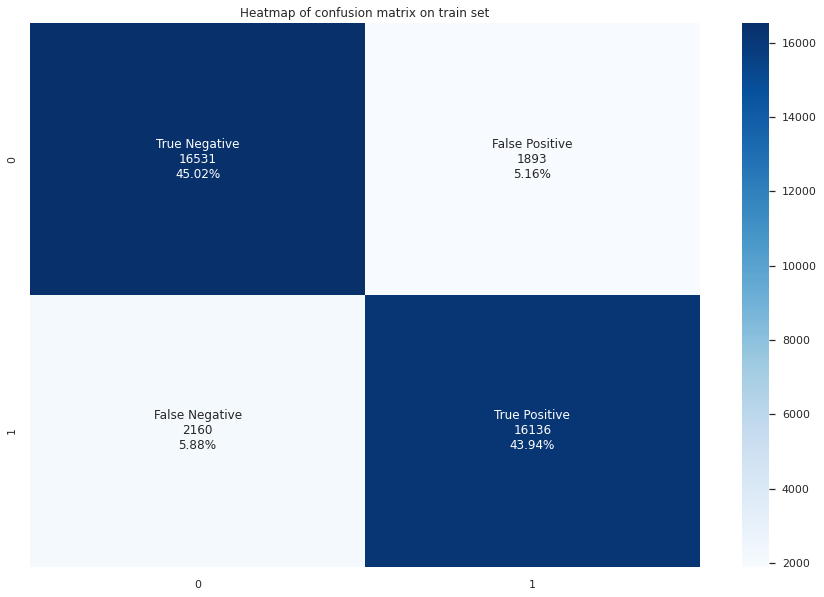



======================================== Top 10 Feature Importance ========================================


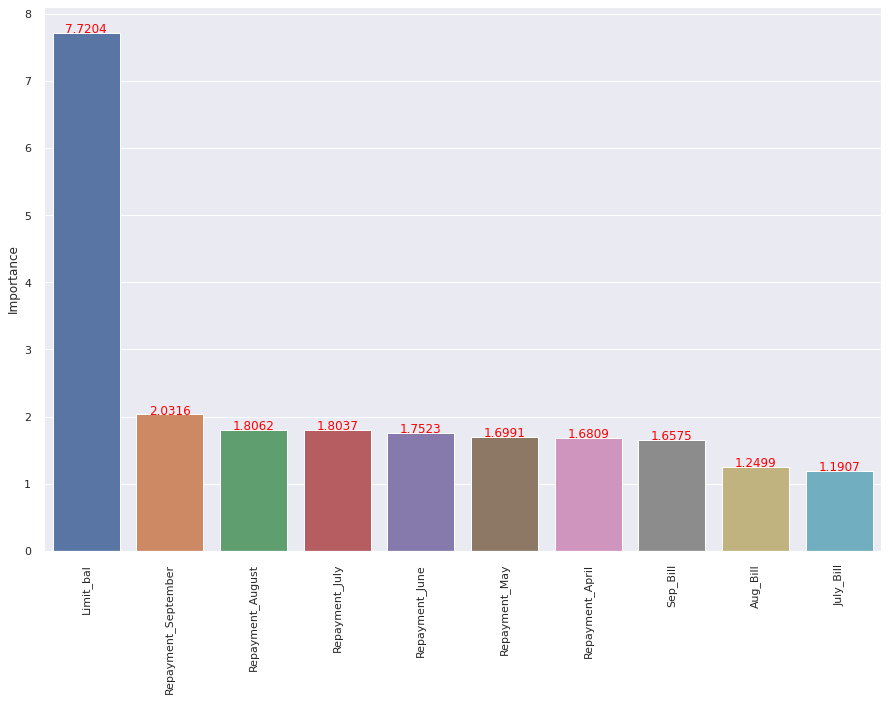

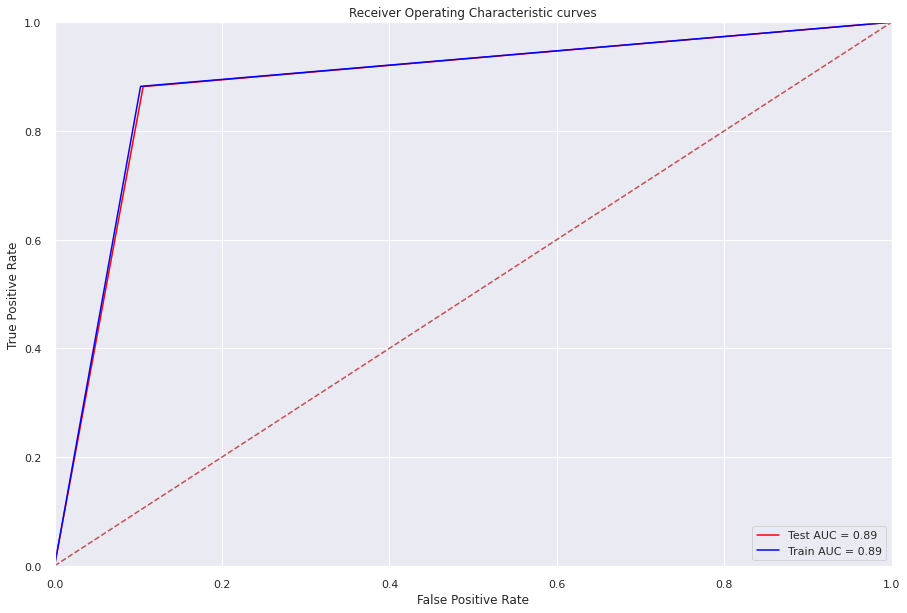

In [ ]:
# Fit and evalute model with the help of self define function
sgd_train_pred, sgd_test_pred =  matrix(sgd_grid,X_train_scaled,X_test_scaled,y_train,y_test,logistic=True)

##<b> Support Vector Classifier

In [ ]:
# parameter for Support Vector Classifier
svc_params = {'C':[5],# range(5,10,2),
              'kernel':['rbf'],#'linear', 'poly', 'sigmoid',],    
}
# After finding the best parameters, we commented on all the other parameters for faster execution

In [ ]:
# using grid search cv for hyperparameter tuning
svc_grid = GridSearchCV(SVC(),param_grid=svc_params,cv=5,verbose=True,scoring='recall',n_jobs=-1)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


============================== Training score ==============================


Training score  =  0.9179055531263665


==================== Best Parameters and Best score ====================
best parameters  =   {'C': 5, 'kernel': 'rbf'}
Best score  =   0.9018365374994213


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.9113289760348584
Test Accuracy score =  0.8934640522875817
Train Precision score =  0.9054345481992667
Test Precision score =  0.8915636983383042
Train Recall score =  0.9179055531263665
Test Recall score =  0.8992264718521702
Train F1 score =  0.9116274020193247
Test F1 score =  0.8953786906290115
Train ROC_AUC score =  0.911351821287456
Test ROC_AUC score =  0.8933825686702301


============================== Metrices scores on Train and Test Set ==============================
              precision    recall  f1-score   support

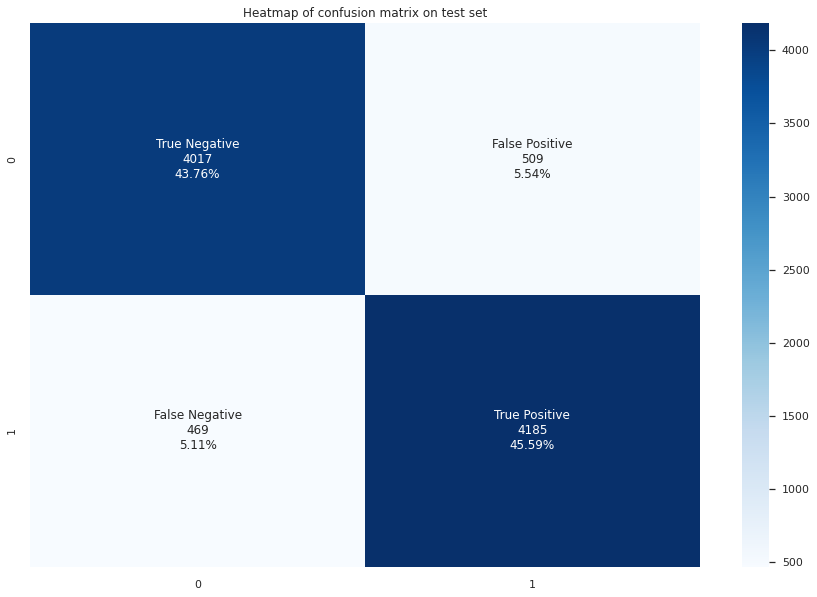



============================== Confusion Matrix on train set ==============================


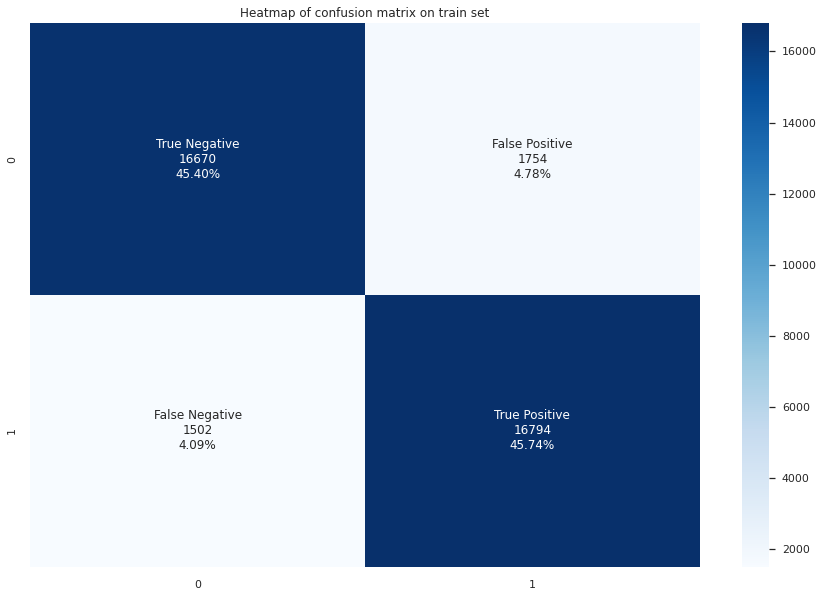



======================================== Top 10 Feature Importance ========================================


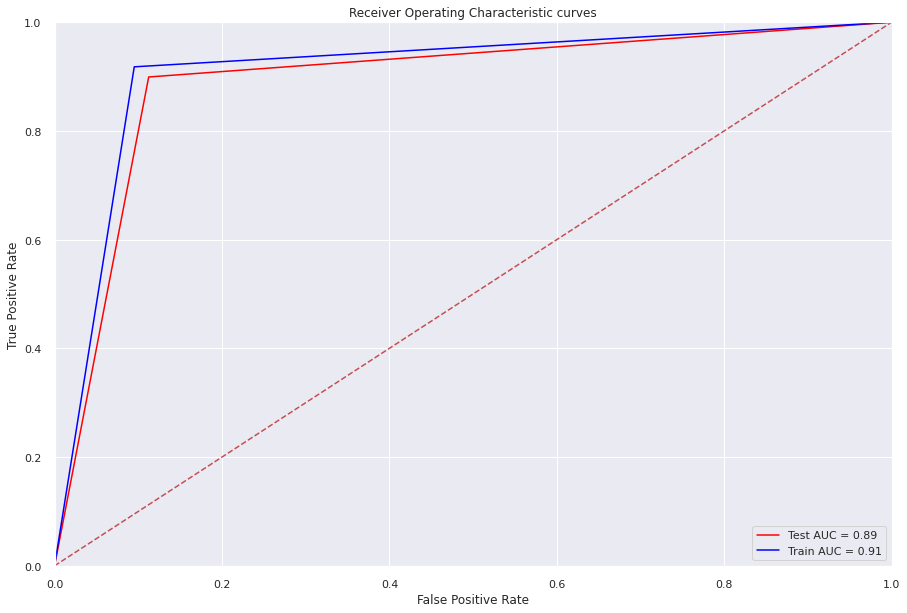

In [ ]:
# Fit and evalute model with the help of self define function
svc_train_pred, svc_test_pred = matrix(svc_grid,X_train_scaled,X_test_scaled,y_train,y_test,logistic=True)

##<b> K Nearest Neighbour

In [ ]:
knn_params = {
    'n_neighbors':[7],#5,10,15,20],
    'weights':['uniform'],#'distance'], 
    'algorithm':['auto'],#'auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size':[50],#20,30,40,]
}

In [ ]:
# using grid search cv for hyperparameter tuning
knn_grid = GridSearchCV(KNeighborsClassifier(),param_grid=knn_params,cv=2,verbose=True,n_jobs=-1)

Fitting 2 folds for each of 1 candidates, totalling 2 fits


============================== Training score ==============================


Training score  =  0.9177559912854031


==================== Best Parameters and Best score ====================
best parameters  =   {'algorithm': 'auto', 'leaf_size': 50, 'n_neighbors': 7, 'weights': 'uniform'}
Best score  =   0.8862745098039215


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.9177559912854031
Test Accuracy score =  0.8929193899782135
Train Precision score =  0.9173770491803279
Test Precision score =  0.8998039642779351
Train Recall score =  0.9175776125929165
Test Recall score =  0.8876235496347228
Train F1 score =  0.917477319925675
Test F1 score =  0.8936722552731206
Train ROC_AUC score =  0.9177553716460023
Test ROC_AUC score =  0.8929942759220896


============================== Metrices scores on Train and Test Set ==============================


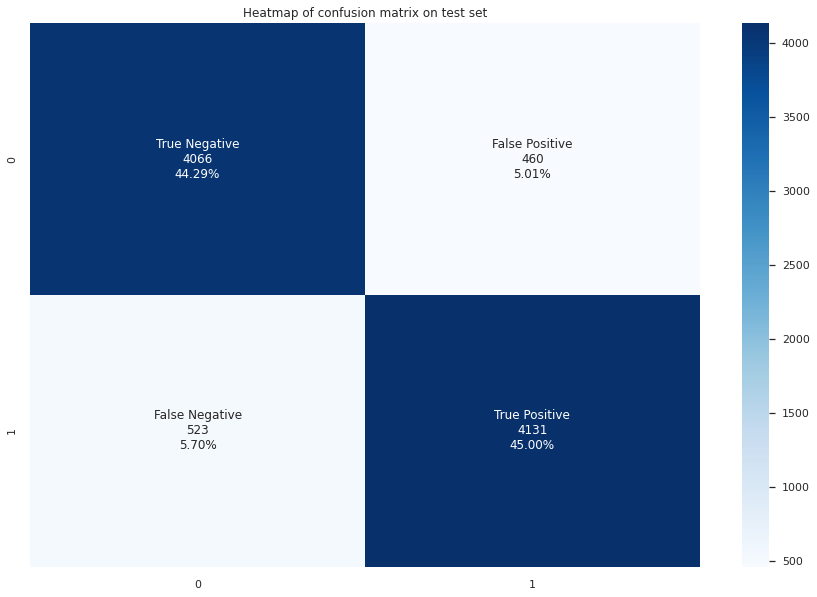



============================== Confusion Matrix on train set ==============================


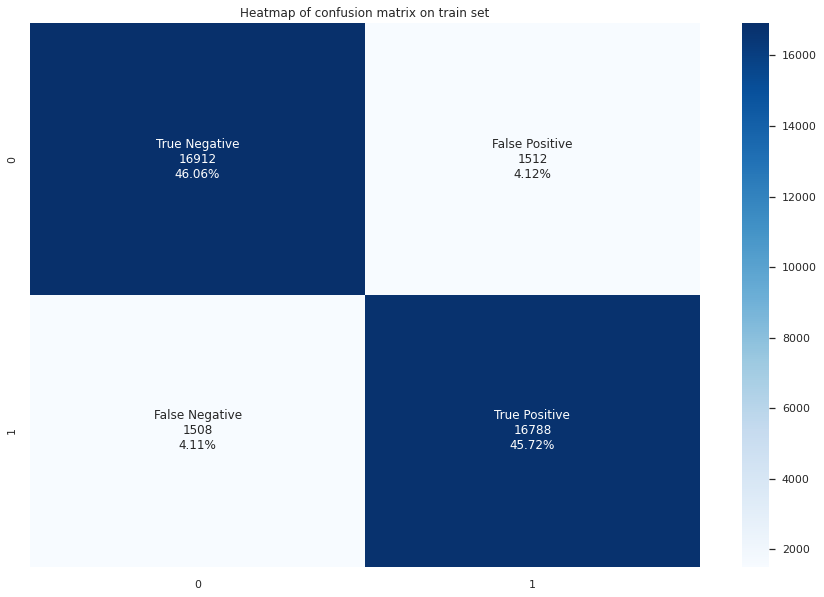



======================================== Top 10 Feature Importance ========================================


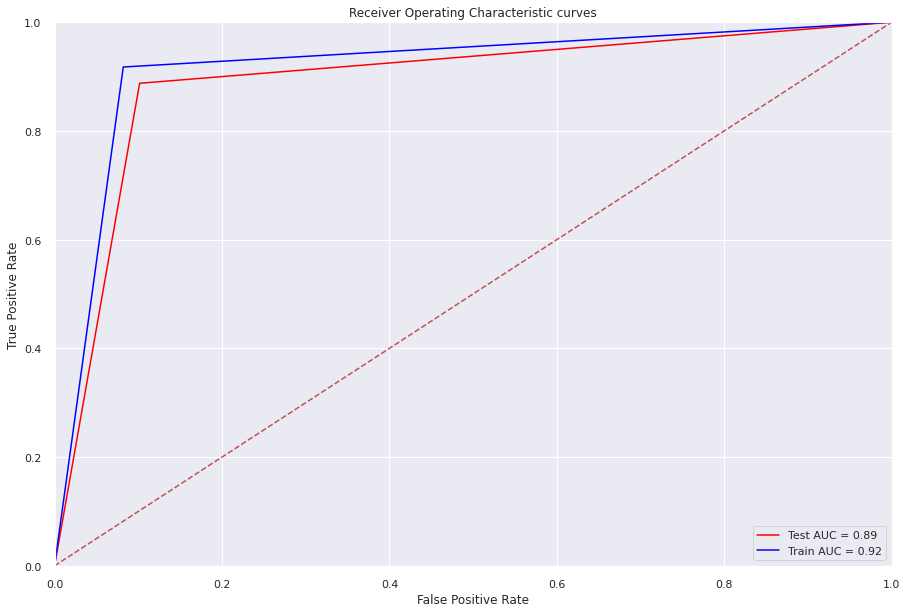

In [ ]:
knn_train_pred, knn_test_pred = matrix(knn_grid,X_train_scaled,X_test_scaled,y_train,y_test)

##<b> Decision Tree

In [ ]:
# parametrs for decision tree
d_tree_params = {
    'max_depth': [10,],#2, 3, 5, 10, 20],
    'min_samples_leaf': [100,],#5, 10, 20, 50, 100],
    'criterion': ["entropy",],#"gini", ]
}
# After finding the best parameters, we commented on all the other parameters for faster execution

In [ ]:
# using grid search cv for hyperparameter tuning
dtree_grid = GridSearchCV(DecisionTreeClassifier(),param_grid=d_tree_params,cv=5,verbose=True,n_jobs=-1)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


============================== Training score ==============================


Training score  =  0.8948257080610021


==================== Best Parameters and Best score ====================
best parameters  =   {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 100}
Best score  =   0.8850490196078431


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.8948257080610021
Test Accuracy score =  0.8891067538126362
Train Precision score =  0.8850298762270593
Test Precision score =  0.8859872611464968
Train Recall score =  0.9067009182334936
Test Recall score =  0.8966480446927374
Train F1 score =  0.8957343412526998
Test F1 score =  0.8912857753096967
Train ROC_AUC score =  0.894866959333855
Test ROC_AUC score =  0.8890001160273233


============================== Metrices scores on Train and Test Set ==============================
            

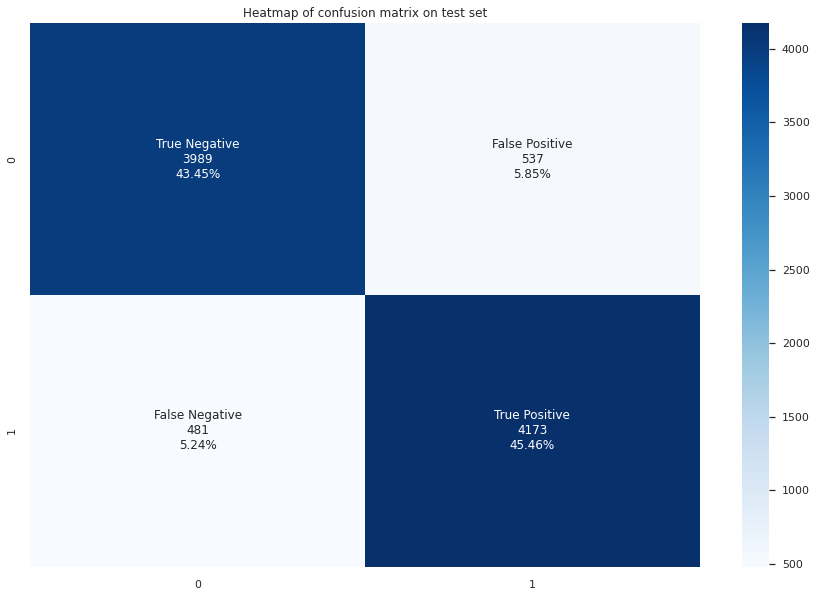



============================== Confusion Matrix on train set ==============================


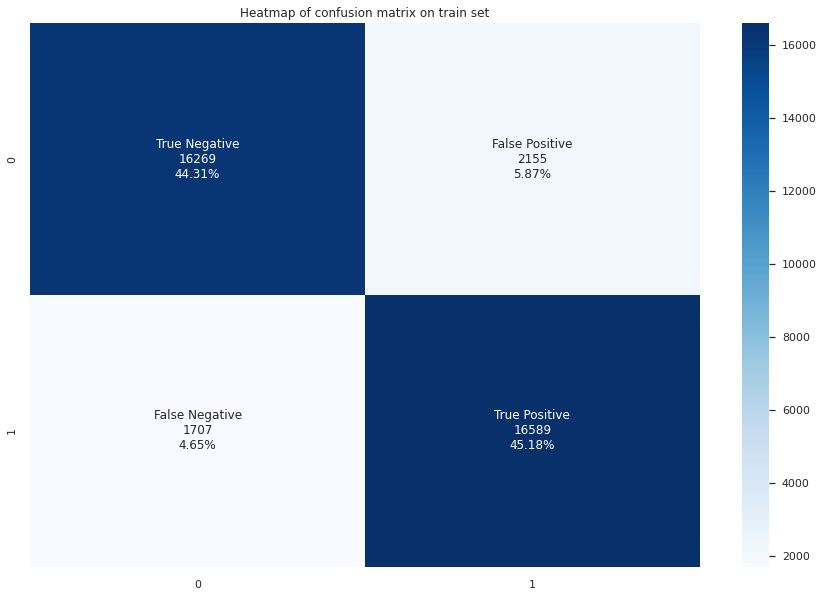



======================================== Top 10 Feature Importance ========================================


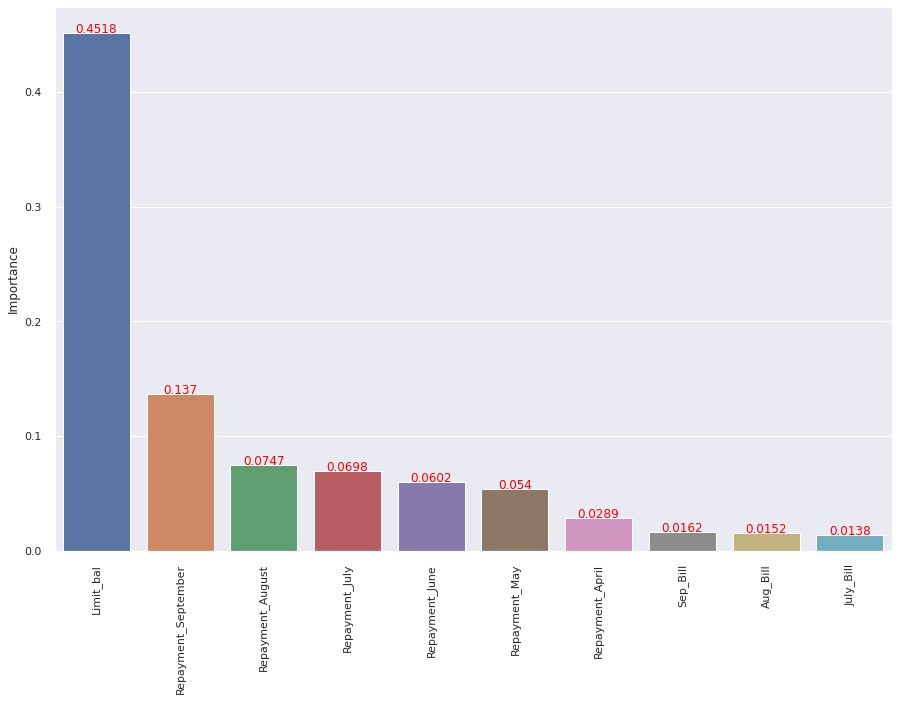

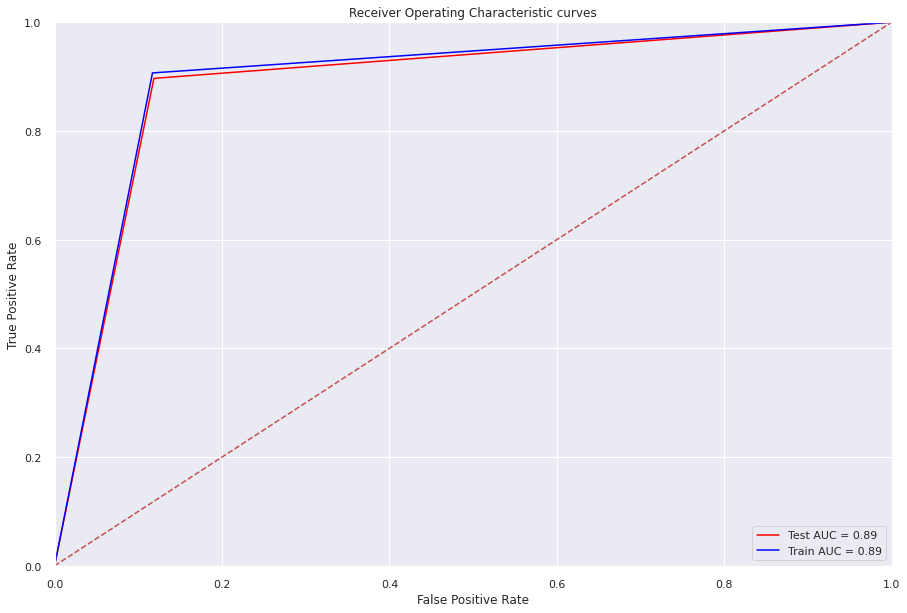

In [ ]:
# Fit and evalute model with the help of self define function
dstree_train_pred, dstree_test_pred = matrix(dtree_grid,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Visualizing Decision Tree 

In [ ]:
# Visualizing Decision Tree 
viz = dtreeviz(dtree_grid.best_estimator_,X_train_scaled,y_train, # Passing the model which is best in grid search and pass X_train and y_train
               target_name ='Defaulter', #Dependent variable
               feature_names=X_train.columns, # Taking column names from X_train data frame 
               )
viz

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


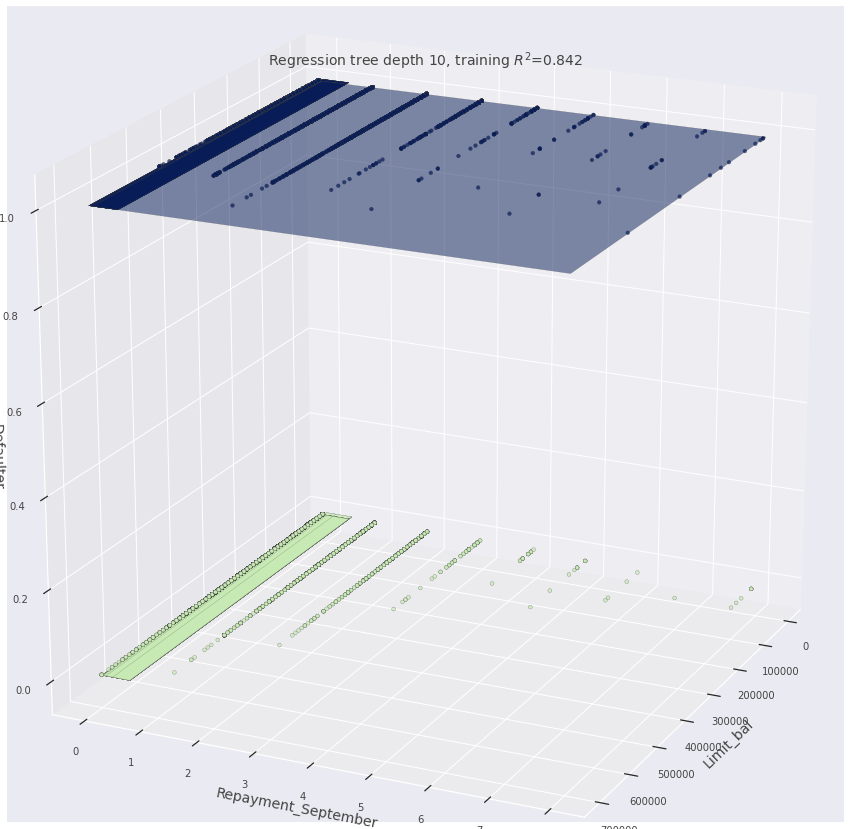

In [ ]:
#import for 3D graph
from mpl_toolkits.mplot3d import Axes3D
from dtreeviz.trees import *
# ploting the graph
figsize = (15,15)
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111, projection='3d')

t = rtreeviz_bivar_3D(dtree_grid.best_estimator_,
                      X_train, y_train,
                      feature_names=X.columns,
                      target_name='Defaulter',
                      fontsize=14,
                      elev=20,
                      azim=25,
                      dist=8.2,
                      show={'splits','title'},
                      ax=ax)
plt.show()

###<b> Model Explainability with Lime

In [ ]:
lime_explainibilty(dtree_grid.best_estimator_, 8,2)

###<b> Model Explainability with ELI5

In [ ]:
eli5_explainability(dtree_grid.best_estimator_,2)

##<b> Random Forest

In [ ]:
# parameter for Random Forest
rf_params = {'n_estimators':[200],#100,300,250],
             'criterion':['gini'],#'entropy'],
              'min_samples_leaf':[30],#5,6,10]
              'max_depth' : [50],#,20,30,70],
              'min_samples_split': [10],#15,20,30]
              'max_features':['sqrt',]
              }
# After finding the best parameters, we commented on all the other parameters for faster execution

In [ ]:
# using grid search cv for hyperparameter tuning
rf_grid = GridSearchCV(RandomForestClassifier(),rf_params,cv=5,scoring='recall',verbose=True,n_jobs=-1)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


============================== Training score ==============================


Training score  =  0.964965019676432


==================== Best Parameters and Best score ====================
best parameters  =   {'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 30, 'min_samples_split': 10, 'n_estimators': 200}
Best score  =   0.9569852762183821


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.9110566448801742
Test Accuracy score =  0.9059912854030501
Train Precision score =  0.8705621301775148
Test Precision score =  0.8689896826941795
Train Recall score =  0.964965019676432
Test Recall score =  0.9591749033089815
Train F1 score =  0.9153359601824969
Test F1 score =  0.9118578286181187
Train ROC_AUC score =  0.9112439080145076
Test ROC_AUC score =  0.9052392413142344


============================== Metrices scores 

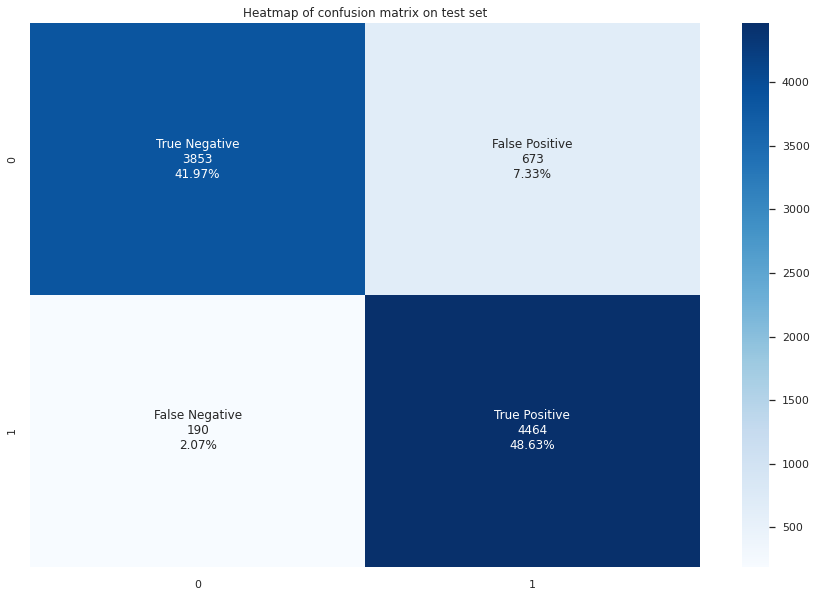



============================== Confusion Matrix on train set ==============================


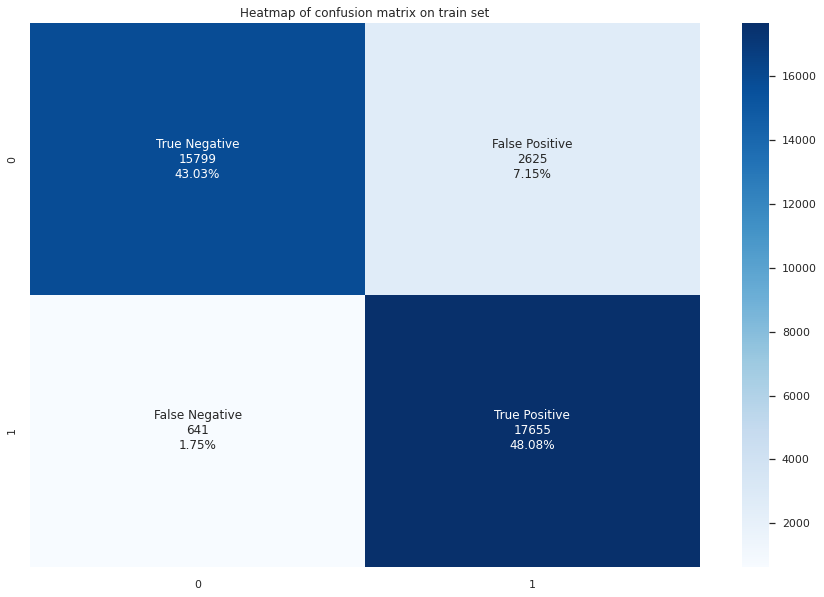



======================================== Top 10 Feature Importance ========================================


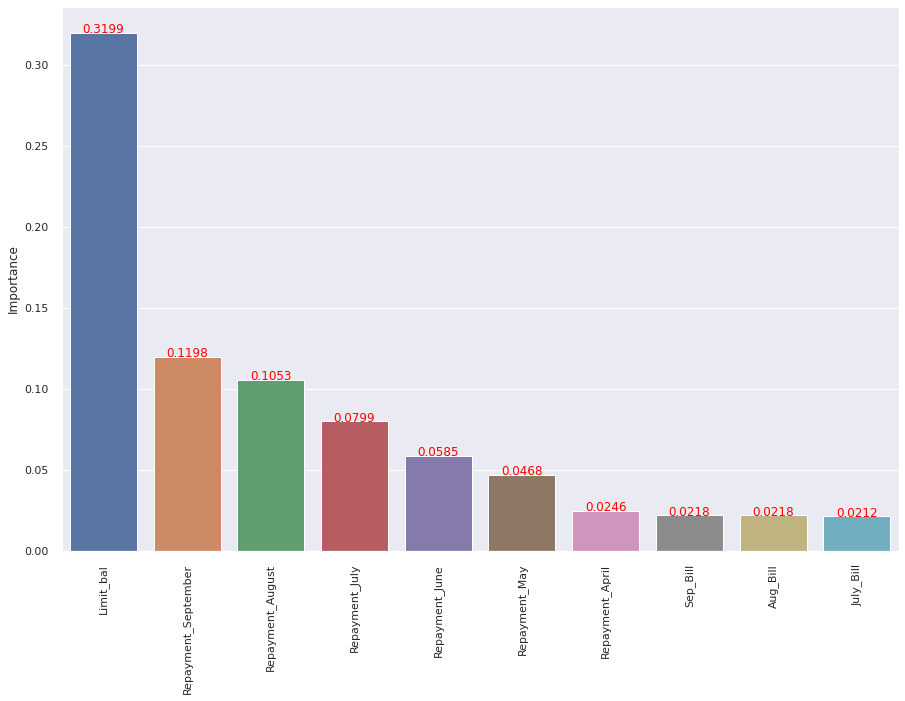

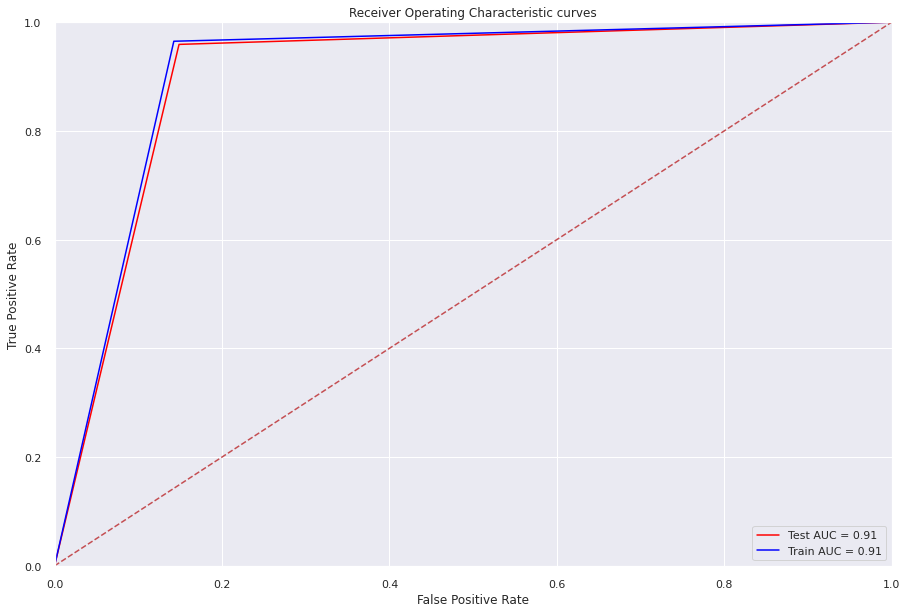

In [ ]:
# Fit and evalute model with the help of self define function
rf_train_pred, rf_test_pred = matrix(rf_grid,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model Explainability with Lime

In [ ]:
lime_explainibilty(rf_grid.best_estimator_, 8,2)

###<b> Model Explainability with ELI5

In [ ]:
eli5_explainability(rf_grid.best_estimator_,1)

##<b> Ada Boost Classifier

In [ ]:
# parameter for AdaBoostClassifier
param_grid = {'n_estimators': [200],#50,100,150,200,300],
              'learning_rate':[1.0],#0.001,0.01,0.1],
              'algorithm':['SAMME.R'],#'SAMME',],
              }
# After finding the best parameters, we commented on all the other parameters for faster execution

In [ ]:
# using grid search cv for hyperparameter tuning
ada_boost_grid = GridSearchCV(AdaBoostClassifier(),param_grid,cv=5,scoring='recall',verbose=True,n_jobs=-1)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


============================== Training score ==============================


Training score  =  0.8975732400524705


==================== Best Parameters and Best score ====================
best parameters  =   {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 200}
Best score  =   0.8968082592962633


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.905446623093682
Test Accuracy score =  0.9007625272331155
Train Precision score =  0.9113207547169812
Test Precision score =  0.9099671412924425
Train Recall score =  0.8975732400524705
Test Recall score =  0.8925655350236356
Train F1 score =  0.9043947571318428
Test F1 score =  0.9011823408178761
Train ROC_AUC score =  0.9054192730874597
Test ROC_AUC score =  0.9008784369771292


============================== Metrices scores on Train and Test Set ==============================
           

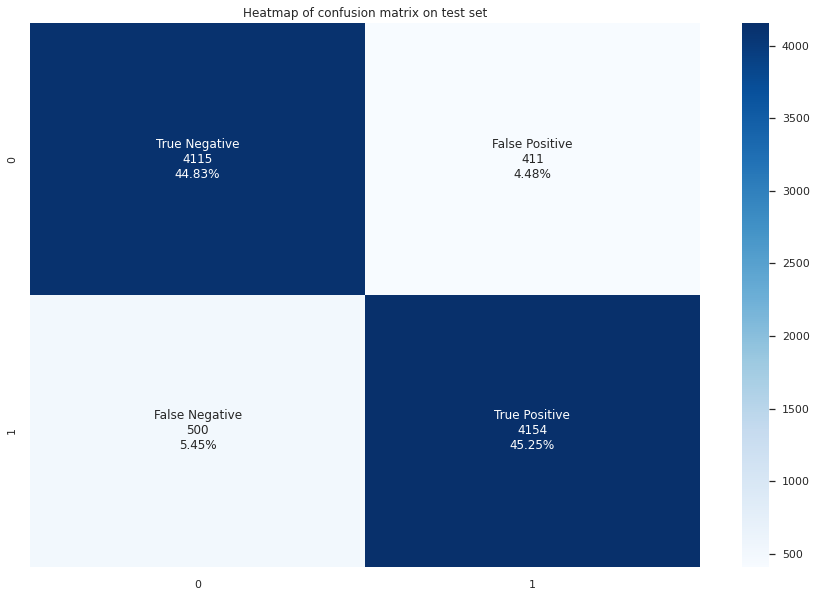



============================== Confusion Matrix on train set ==============================


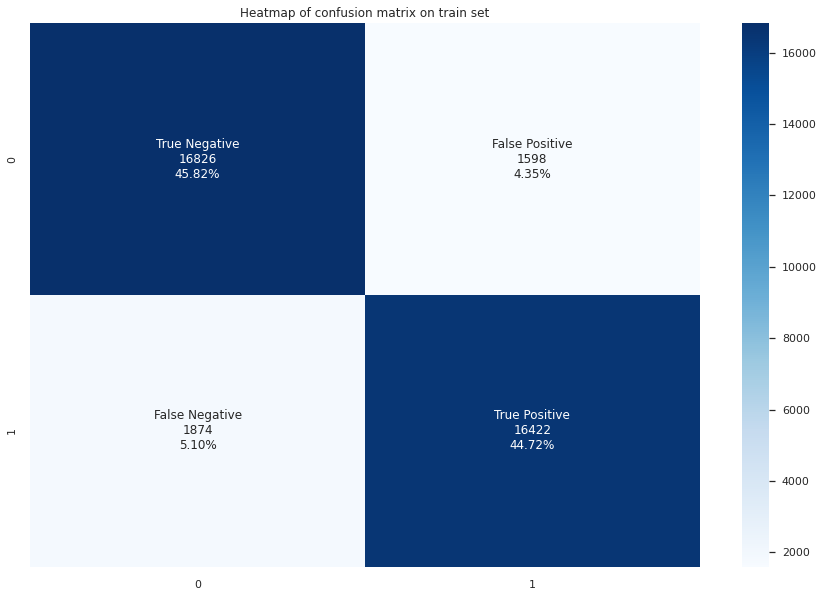



======================================== Top 10 Feature Importance ========================================


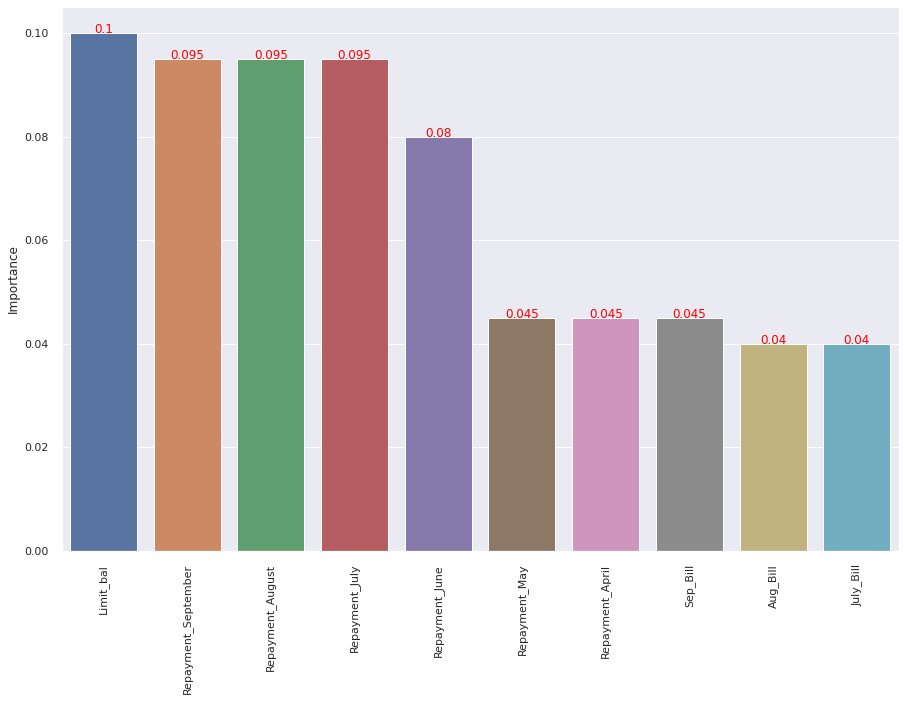

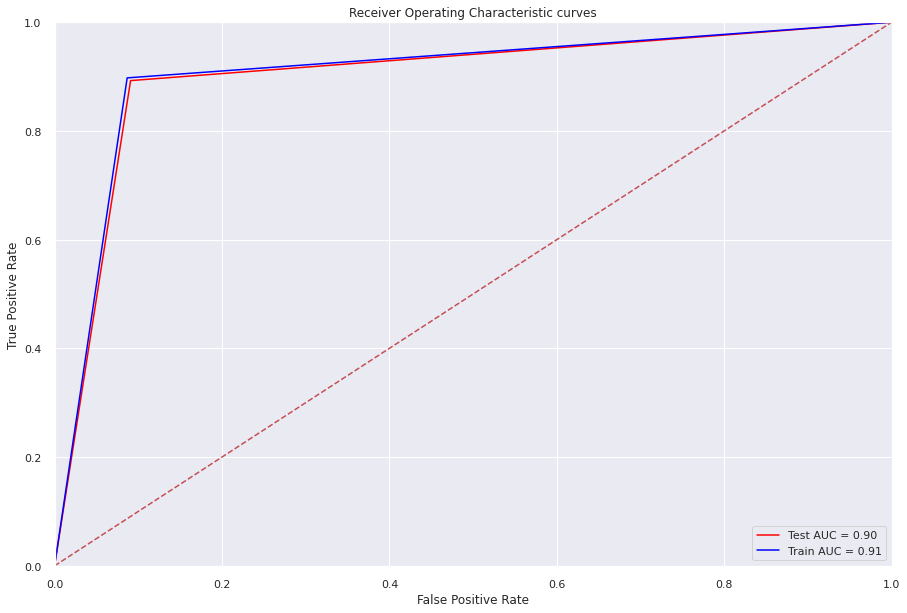

In [ ]:
# Fit and evalute model with the help of self define function
ada_train_pred, ada_test_pred = matrix(ada_boost_grid,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model Explainability with Lime

In [ ]:
lime_explainibilty(ada_boost_grid.best_estimator_, 8,2)

###<b> Model Explainability with ELI5

In [ ]:
eli5_explainability(ada_boost_grid.best_estimator_,5)

AdaBoostClassifier is not supported for 200 estimator

##<b> Gradient Boosting

In [ ]:
# parameter for Gradient Boosting
gb_params = {
    'max_depth': [17,],#10,15,20,25],
    'n_estimators': [300],#50,100,200,400,],
    'learning_rate': [0.005],#0.001,0.01,0.1,1.0],
    'min_samples_leaf':[20],#15,20,25],
    'min_samples_split':[65],#50,55,60,70],
  }
# After finding the best parameters, we commented on all the other parameters for faster execution

In [ ]:
# using grid search cv for hyperparameter tuning
gb_grid = GridSearchCV(GradientBoostingClassifier(),gb_params,cv=2,scoring='recall',verbose=4,n_jobs=-1)

Fitting 2 folds for each of 1 candidates, totalling 2 fits


============================== Training score ==============================


Training score  =  0.9671512898994316


==================== Best Parameters and Best score ====================
best parameters  =   {'learning_rate': 0.005, 'max_depth': 17, 'min_samples_leaf': 20, 'min_samples_split': 65, 'n_estimators': 300}
Best score  =   0.9388390905115872


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.9521241830065359
Test Accuracy score =  0.9154684095860567
Train Precision score =  0.9386272013579461
Test Precision score =  0.901615575807788
Train Recall score =  0.9671512898994316
Test Recall score =  0.9353244520842287
Train F1 score =  0.9526757833530741
Test F1 score =  0.9181607255853196
Train ROC_AUC score =  0.9521763831173231
Test ROC_AUC score =  0.915187634791562


============================== Metrices scores on Train and Test Set

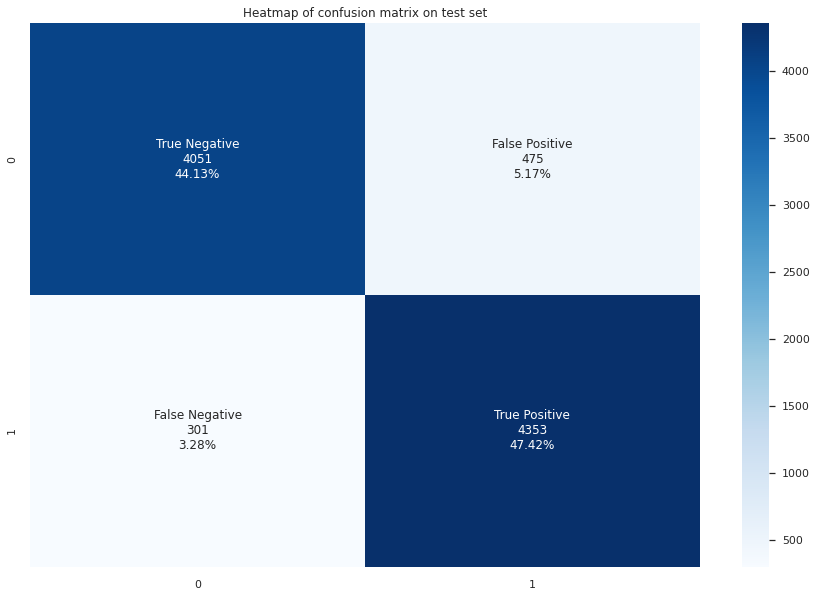



============================== Confusion Matrix on train set ==============================


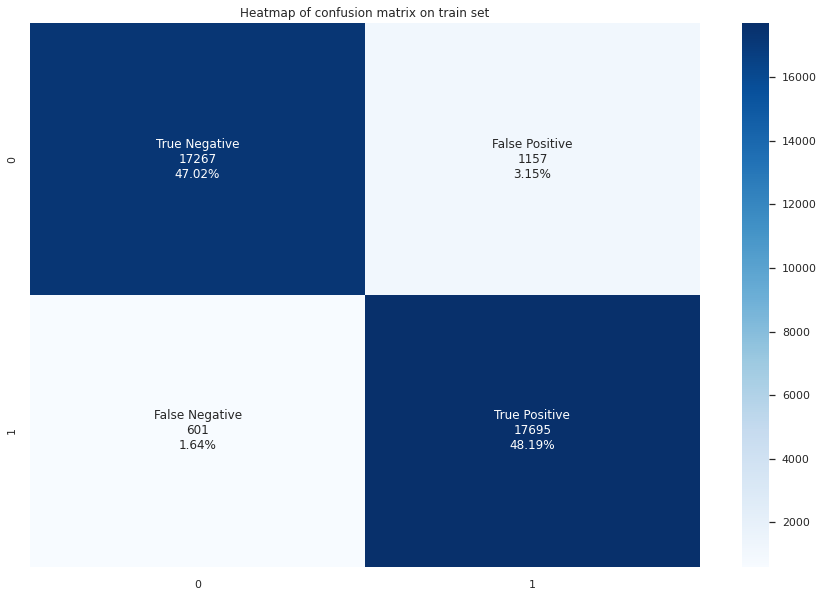



======================================== Top 10 Feature Importance ========================================


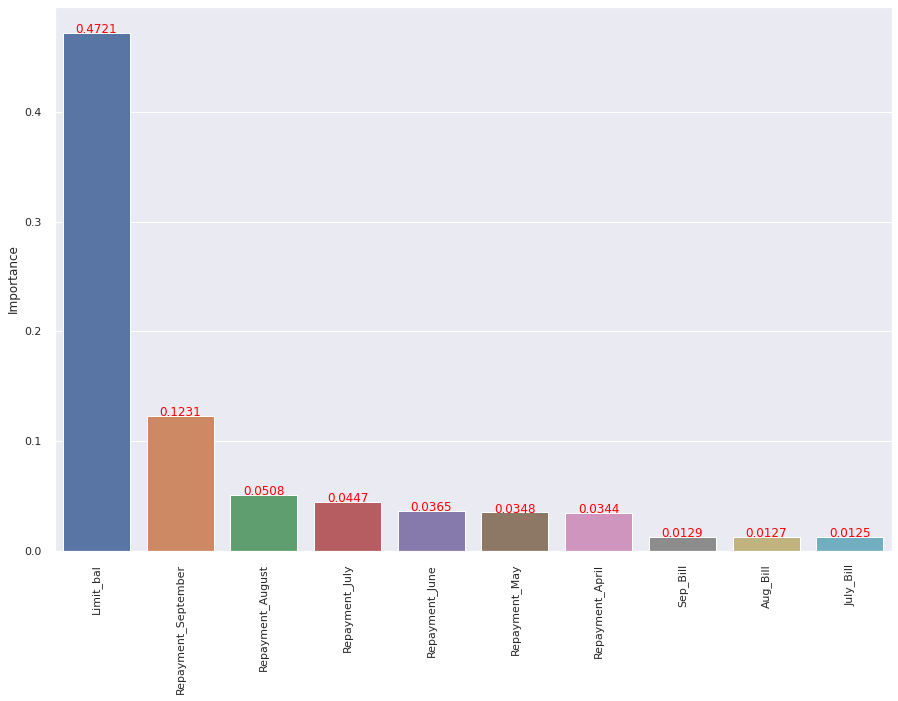

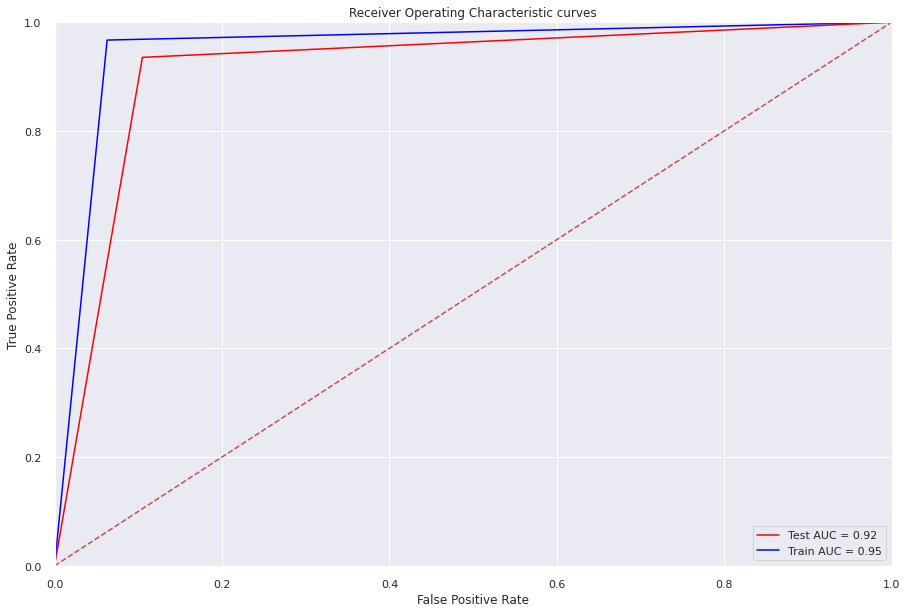

In [ ]:
# Fit and evalute model with the help of self define function
gb_train_pred, gb_test_pred =matrix(gb_grid,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model Explainability with Lime

In [ ]:
lime_explainibilty(gb_grid.best_estimator_, 8,2)

###<b> Model Explainability with ELI5

In [ ]:
eli5_explainability(gb_grid.best_estimator_,5)

##<b> Extreme Gradient Boosting

In [ ]:
# parameters for Extreme Gradient Boosting
xgb_params = {
          'subsample': [0.5],#0.3,0.7], 
          'n_thread': [4], #2,6],
          'n_estimators': [1000],#range(200,1500,50), 
          'min_child_weight': [2],#3,5], 
          'max_depth': [4],#range(2,8,2), 
          'learning_rate': [0.02],#0.04,0.06], 
          'eval_mertric': ['rmse'],#'mse',], 
          'colsample_bytree': [0.7],#0.5,1.0],  
          }
# After finding the best parameters, we commented on all the other parameters for faster execution

In [ ]:
# using grid search cv for hyperparameter tuning
xgb_grid_search= GridSearchCV(XGBClassifier(silent=True),param_grid=xgb_params,cv=5,n_jobs=-1)



============================== Training score ==============================


Training score  =  0.9290849673202615


==================== Best Parameters and Best score ====================
best parameters  =   {'colsample_bytree': 0.7, 'eval_mertric': 'rmse', 'learning_rate': 0.02, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 1000, 'n_thread': 4, 'subsample': 0.5}
Best score  =   0.9160130718954248


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.9290849673202615
Test Accuracy score =  0.9171023965141613
Train Precision score =  0.9205166684532105
Test Precision score =  0.909703220374658
Train Recall score =  0.9387297770004372
Test Recall score =  0.928663515255694
Train F1 score =  0.9295340152622179
Test F1 score =  0.9190855927698034
Train ROC_AUC score =  0.9291184707841961
Test ROC_AUC score =  0.9169389162668218


============================== Metrices scores on Train and Test Set ===

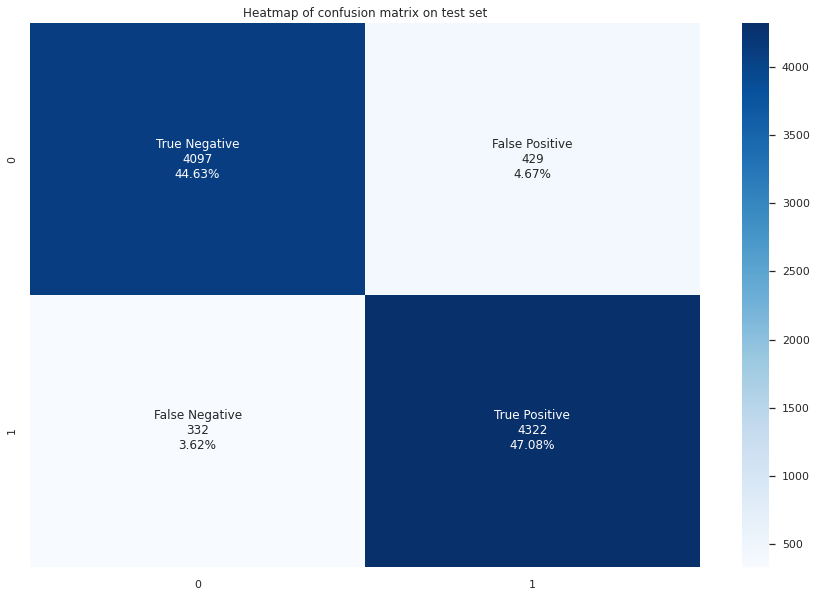



============================== Confusion Matrix on train set ==============================


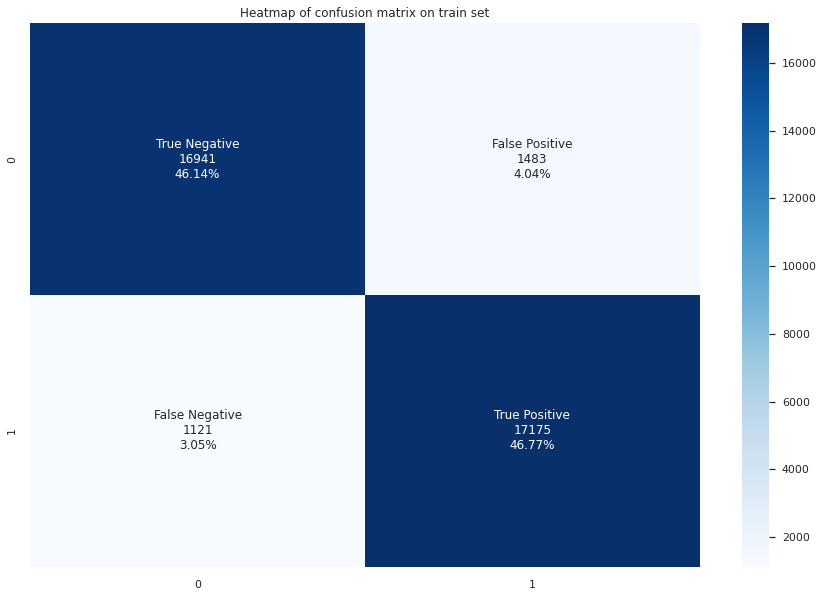



======================================== Top 10 Feature Importance ========================================


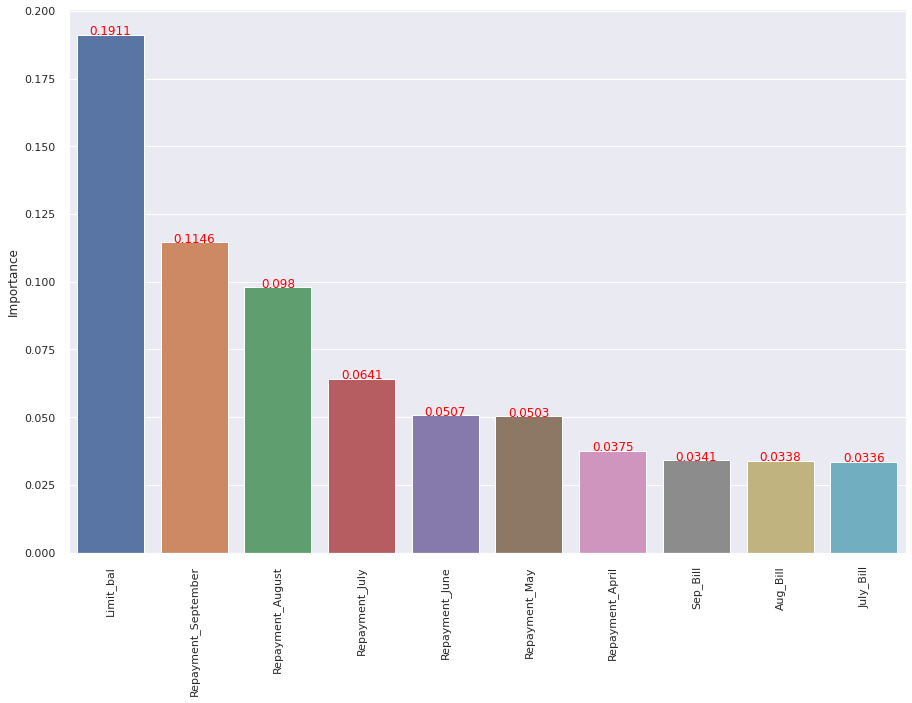

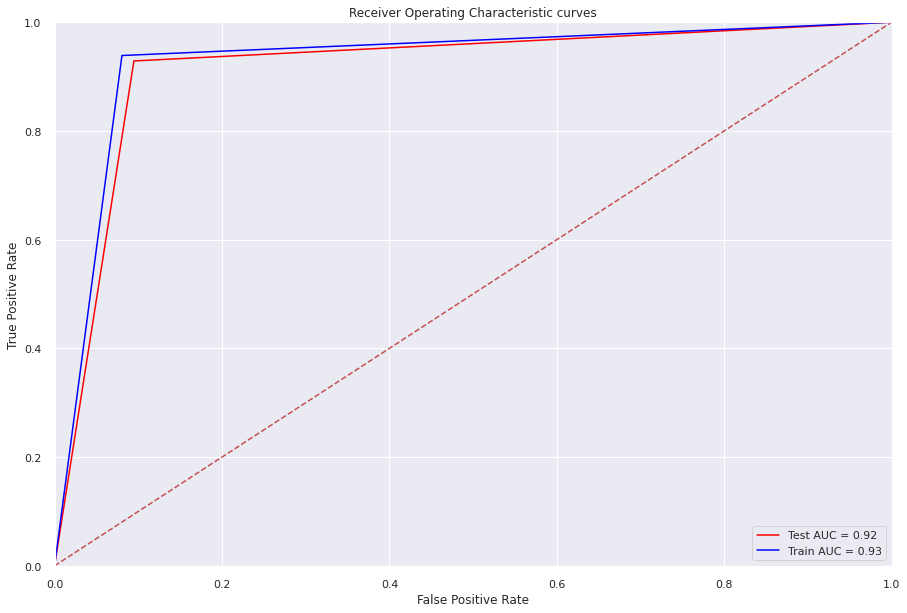

In [ ]:
# Fit and evalute model with the help of self define function
xgb_train_pred, xgb_test_pred = matrix(xgb_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model Explainability with Lime

In [ ]:
lime_explainibilty(xgb_grid_search.best_estimator_, 8,2)

###<b> Model Explainability with ELI5

In [ ]:
eli5_explainability(xgb_grid_search.best_estimator_,5)

##<b>Stacking Classifier

In [ ]:
# import stacking regressor from sklearn ensemble
from sklearn.ensemble import StackingClassifier

In [ ]:
# Base Estimators 
estimators = [('lr',logistic_grid_search.best_estimator_),('sgd',sgd_grid.best_estimator_),
              ('svc',svc_grid.best_estimator_),('dt',dtree_grid.best_estimator_),('rf',rf_grid.best_estimator_),
       ('ada_boost',ada_boost_grid.best_estimator_),('gb',gb_grid.best_estimator_),
       ]

In [ ]:
# In FInal estimator we use Gradient Boosting Regressor
final_estimator = xgb_grid_search.best_estimator_

In [ ]:
# creating a variable for StackingRegressor
stacking=StackingClassifier(estimators=estimators,final_estimator=final_estimator,passthrough=True,n_jobs=-1)



============================== Training score ==============================


Training score  =  0.9508169934640522


==================== Best Parameters and Best score ====================


============================== Metrices scores on Train and Test Set ==============================
Train Accuracy score =  0.9508169934640522
Test Accuracy score =  0.9193899782135077
Train Precision score =  0.9469803751490838
Test Precision score =  0.917805294619983
Train Recall score =  0.954744206383909
Test Recall score =  0.9237215298667812
Train F1 score =  0.9508464427630504
Test F1 score =  0.9207539087599058
Train ROC_AUC score =  0.9508306355410643
Test ROC_AUC score =  0.9193287278145217


============================== Metrices scores on Train and Test Set ==============================
              precision    recall  f1-score   support

     class 0       0.92      0.91      0.92      4526
     class 1       0.92      0.92      0.92      4654

    accuracy                   

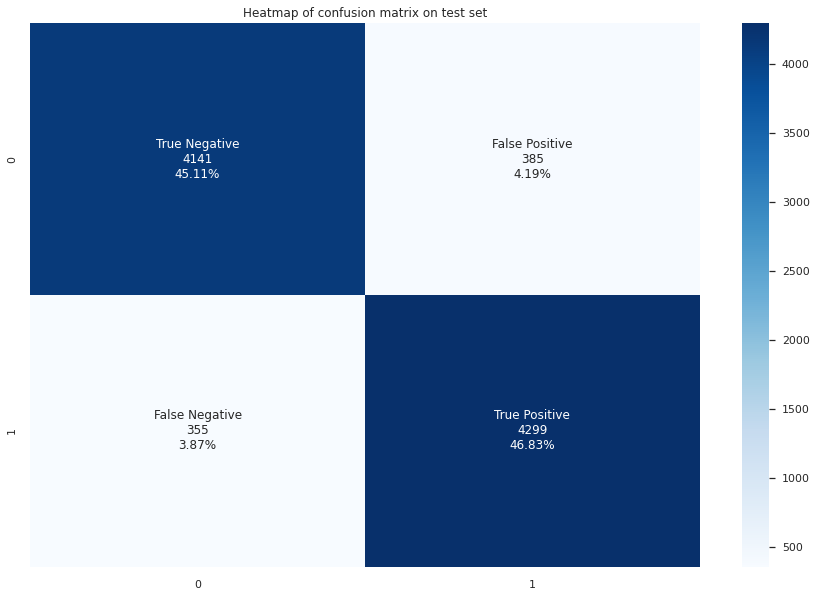



============================== Confusion Matrix on train set ==============================


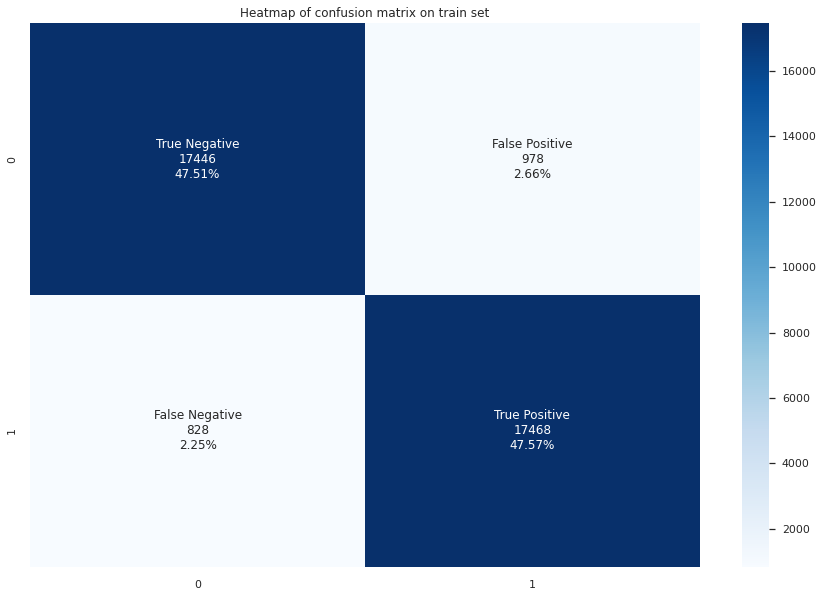



======================================== Top 10 Feature Importance ========================================


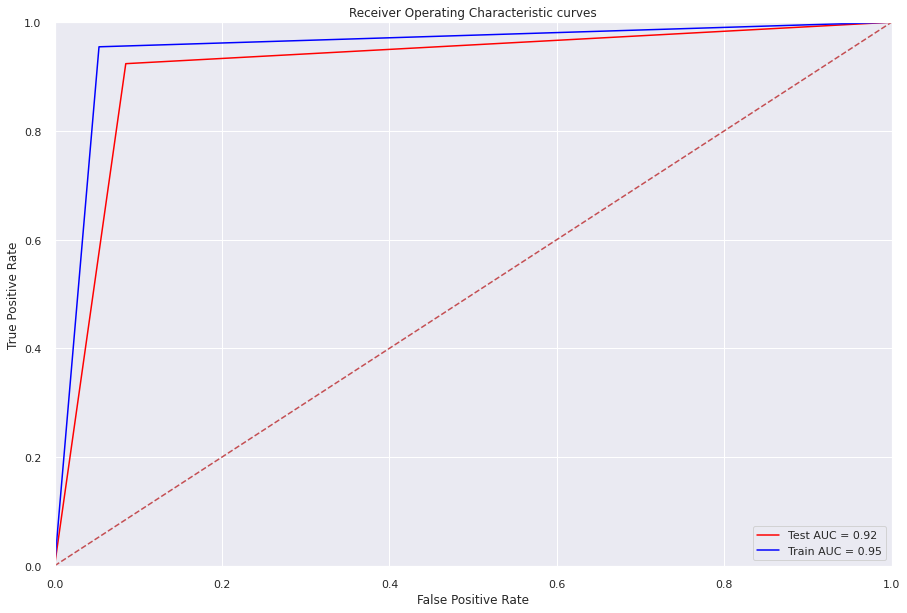

In [ ]:
stacking_train_pred, stacking_test_pred = matrix(stacking,X_train_scaled,X_test_scaled,y_train,y_test)

###<b> Model Explainability with Lime

In [ ]:
lime_explainibilty(stacking, 8,2)

#<b> Final matrix Dataframe

In [ ]:
#creating final matrices dataframe
final_matrix_df=pd.DataFrame(list(zip(train_accuracy_score,test_accuracy_score,train_precision_score,test_precision_score,
                                 train_recall_score,test_recall_score,train_f1_score,test_f1_score,train_roc_score,test_roc_score )),
                        index=['Logistic Regression', 'Stochastic Gradient Descent', 'Support Vector Classifier','K Nearest Neighbour',
                               'Decision Tree','Random Forest','Ada Boost Classifier','Gradient Boosting','Extreme Gradient Boosting','Stacking Classifier'],
                        columns=['Train accuracy score','Test accuracy score','Train precision score','Test precision score',
                                 'Train recall score','Test recall score','Train f1 score','Test f1 score','Train roc score','Test roc score']).sort_values("Test recall score",ascending=False)

In [ ]:
# ascending with highest recall score
final_matrix_df=final_matrix_df.sort_values("Test recall score",ascending=False).reset_index().rename(columns={'index':'model'})

In [ ]:
final_matrix_df

,model,Train accuracy score,Test accuracy score,Train precision score,Test precision score,Train recall score,Test recall score,Train f1 score,Test f1 score,Train roc score,Test roc score
0,Random Forest,0.911057,0.905991,0.870562,0.868990,0.964965,0.959175,0.915336,0.911858,0.911244,0.905239
1,Gradient Boosting,0.952124,0.915468,0.938627,0.901616,0.967151,0.935324,0.952676,0.918161,0.952176,0.915188
2,Extreme Gradient Boosting,0.929085,0.917102,0.920517,0.909703,0.938730,0.928664,0.929534,0.919086,0.929118,0.916939
3,Stacking Classifier,0.950817,0.919390,0.946980,0.917805,0.954744,0.923722,0.950846,0.920754,0.950831,0.919329
4,Support Vector Classifier,0.911329,0.893464,0.905435,0.891564,0.917906,0.899226,0.911627,0.895379,0.911352,0.893383
5,Decision Tree,0.894826,0.889107,0.885030,0.885987,0.906701,0.896648,0.895734,0.891286,0.894867,0.889000
6,Ada Boost Classifier,0.905447,0.900763,0.911321,0.909967,0.897573,0.892566,0.904395,0.901182,0.905419,0.900878
7,K Nearest Neighbour,0.917756,0.892919,0.917377,0.899804,0.917578,0.887624,0.917477,0.893672,0.917755,0.892994
8,Stochastic Gradient Descent,0.889624,0.887800,0.895002,0.895460,0.881941,0.881607,0.888424,0.888480,0.889597,0.887887
9,Logistic Regression,0.884804,0.883660,0.888478,0.890292,0.879154,0.878814,0.883791,0.884516,0.884784,0.883729


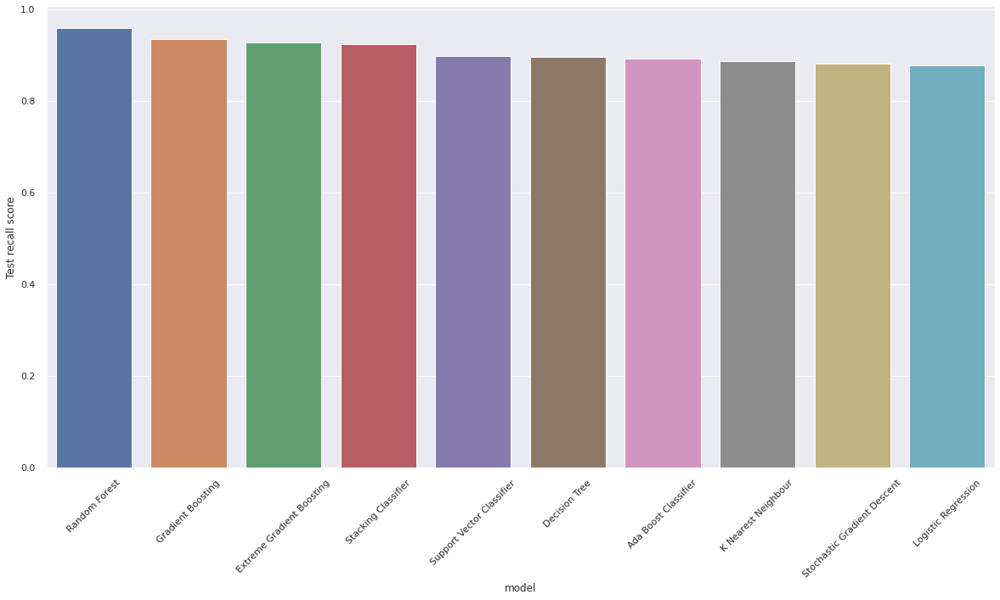

In [ ]:
#bar plot of model wit test recall score
plt.figure(figsize=(20,10))
sns.barplot(final_matrix_df['model'],final_matrix_df['Test recall score'])
plt.xticks(rotation=45)
plt.show()

#<b>ROC curve for all the models

In [ ]:
# storing the best estimator for each models
logistic=logistic_grid_search.best_estimator_
sgd = sgd_grid.best_estimator_
svc = svc_grid.best_estimator_
dt = dtree_grid.best_estimator_
rf = rf_grid.best_estimator_
ada_boost = ada_boost_grid.best_estimator_
gb=gb_grid.best_estimator_
xgb = xgb_grid_search.best_estimator_
stacking = stacking

In [ ]:
# storing the probability given by each model
y_preds_proba_lr = logistic.predict_proba(X_test_scaled)[::,1]
y_preds_proba_dt = dt.predict_proba(X_test_scaled)[::,1]
y_preds_proba_rf = rf.predict_proba(X_test_scaled)[::,1]
y_preds_proba_ada = ada_boost.predict_proba(X_test_scaled)[::,1]
y_preds_proba_gb = gb.predict_proba(X_test_scaled)[::,1]
y_preds_proba_xgb = xgb.predict_proba(X_test_scaled)[::,1]
y_preds_proba_stack = stacking.predict_proba(X_test_scaled)[::,1]

In [ ]:
#creating a list of tuples of all models and its probability 
classifiers_proba = [(logistic, y_preds_proba_lr),
                    (dt, y_preds_proba_dt),
                    (rf, y_preds_proba_rf),
                    (ada_boost, y_preds_proba_ada),
                    (gb, y_preds_proba_gb),
                    (xgb, y_preds_proba_xgb),
                     (stacking, y_preds_proba_stack),
                    
                    ]

# Define a result table as a DataFrame
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])

# Train the models and record the results
for pair in classifiers_proba:
    
    fpr, tpr, _ = roc_curve(y_test,  pair[1])
    auc = roc_auc_score(y_test, pair[1])
    
    result_table = result_table.append({'classifiers':pair[0].__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)

# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

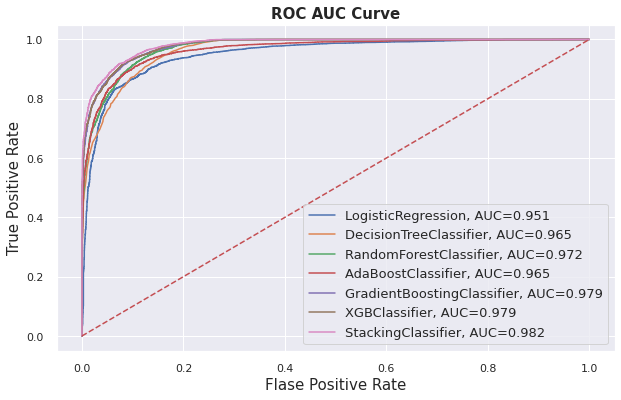

In [ ]:
# ploting the roc auc curve
fig = plt.figure(figsize=(10,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1],'r--')

plt.xlabel("Flase Positive Rate", fontsize=15)

plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC AUC Curve', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

#<b>Conclusion

1. Random Forest Classifier performs the best with a recall of 0.95 on the test set. 
2. Followed by RFC we observed that Gradient Boosting and XGBoost performed the best with test recall score of 0.93 and 0.92 respectively. 
3. We could overcome the overfitting of multi models by using hyperparameter tuning and cross validation, which is evident by comparing the scores before and after. 
4. Model explainability was performed on the Random Forest Classifier using Lime and ELI5, Repayments columns (especially the latest months) has the most significant impact on whether a customer is a Defaulter or Not.

#<b> Pipeline for save model for deployment

In [ ]:
df.head()

,Limit_bal,Gender,Education,Marital_status,Age,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April,Defaulter,Age_group
0,20000,Female,university,married,24,2,2,0,0,0,0,3913,3102,689,0,0,0,0,689,0,0,0,0,1,21-25
1,120000,Female,university,single,26,0,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,26-30
2,90000,Female,university,single,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,31-35
3,50000,Female,university,married,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,36-40
4,50000,Male,university,married,57,0,0,0,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,56-60


In [ ]:
df['Gender']=df['Gender'].apply(lambda x : 1 if x=='Female' else 2)

In [ ]:
df['Education']=df['Education'].apply(lambda x : 1 if x=='university' else (2 if x=='graduate' else (3 if x=='high school' else 0)))

In [ ]:
df['Marital_status']=df['Marital_status'].apply(lambda x : 1 if x=='married' else (2 if x=='single' else 0))

In [ ]:
df.drop(columns=['Age_group'],inplace=True)

In [ ]:
X =df.drop(columns=['Defaulter'])
y =df['Defaulter']

In [ ]:
X.head()

,Limit_bal,Gender,Education,Marital_status,Age,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April
0,20000,1,1,1,24,2,2,0,0,0,0,3913,3102,689,0,0,0,0,689,0,0,0,0
1,120000,1,1,2,26,0,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000
2,90000,1,1,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000
3,50000,1,1,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000
4,50000,2,1,1,57,0,0,0,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679


In [ ]:
#importing SMote to make our dataset balanced
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X,y)

In [ ]:
# train test spilt data
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_smote,y_smote,test_size=0.2,random_state=0)

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline,make_pipeline

In [ ]:
pipe = Pipeline([('scaler', MinMaxScaler()), ('rf', rf_grid.best_estimator_)])

In [ ]:
pipe.fit(X_train,y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('rf',
                 RandomForestClassifier(max_depth=50, max_features='sqrt',
                                        min_samples_leaf=30,
                                        min_samples_split=10,
                                        n_estimators=200))])

In [ ]:
X_test.iloc[0:1]

,Limit_bal,Gender,Education,Marital_status,Age,Repayment_September,Repayment_August,Repayment_July,Repayment_June,Repayment_May,Repayment_April,Sep_Bill,Aug_Bill,July_Bill,June_Bill,May_Bill,Apr_Bill,Pay_Sep,Pay_Aug,Pay_July,Pay_June,Pay_May,Pay_April
9971,500000,2,2,2,32,0,0,0,0,0,0,208603,211340,166739,166464,168722,170299,8444,8009,5301,5220,5419,5313


In [ ]:
pipe.predict(X_test.iloc[0:1])

array([0])

In [ ]:
prob = pipe.predict_proba(X_test.iloc[0:1])

In [ ]:
b=prob.tolist()[0]

In [ ]:
round(b[0],3)

0.99

In [ ]:
pred=pipe.predict(X_test)

In [ ]:
accuracy_score(y_test,pred)

0.8997821350762527

In [ ]:
# export 
import pickle
pickle.dump(pipe,open('pipe.pkl','wb'))